In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
%matplotlib inline
import sklearn
from sklearn.decomposition import NMF
from sklearn.neighbors import kneighbors_graph, NearestNeighbors
from sklearn.metrics.cluster import adjusted_rand_score as ARI
from sklearn.metrics.cluster import normalized_mutual_info_score as NMI
from sklearn.metrics import roc_curve, auc, mean_squared_error, mean_absolute_error, precision_recall_curve, jaccard_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.extmath import randomized_svd, squared_norm
import umap
from scipy.sparse.csgraph import connected_components
import networkx as nx
import community
import cvxpy as cp
import cvxopt
import pickle
import math
from math import sqrt
import scipy as sp
from scipy.cluster.hierarchy import linkage,dendrogram
from scipy.special import comb
from sklearn.metrics import jaccard_score
from sklearn.metrics.pairwise import pairwise_distances
from scipy.sparse import csr_matrix, csc_matrix, coo_matrix, lil_matrix
from scipy.spatial.distance import pdist, jaccard

## simATAC

In [2]:
name = "Buenrostro2018"

In [3]:
count_so_noise_bin_table = pd.read_csv("/home/naoto/scOpen/simATAC/Results/{}/v1.0/count_sim_noise_bin_table_ -1 _ 1 .tsv".format(name), sep="\t")
count_so_bin_table = pd.read_csv("/home/naoto/scOpen/simATAC/Results/{}/v1.0/count_sim_bin_table.tsv".format(name), sep="\t")

In [4]:
print(count_so_noise_bin_table.shape)
print(count_so_bin_table.shape)

(1859323, 3)
(3864780, 3)


In [5]:
count_so_bin_table["i"] = count_so_bin_table["i"] - 1
count_so_bin_table["j"] = count_so_bin_table["j"] - 1
count_so_noise_bin_table["i"] = count_so_noise_bin_table["i"] - 1
count_so_noise_bin_table["j"] = count_so_noise_bin_table["j"] - 1

In [6]:
M_bin = csr_matrix((count_so_bin_table["x"], (count_so_bin_table["i"], count_so_bin_table["j"]))).toarray()
X = csr_matrix((count_so_noise_bin_table["x"], (count_so_noise_bin_table["i"], count_so_noise_bin_table["j"]))).toarray()

In [7]:
print(M_bin.shape)
print(X.shape)
print(count_so_bin_table.shape[0] / (X.shape[0] * X.shape[1]))
print(count_so_noise_bin_table.shape[0] / (M_bin.shape[0] * M_bin.shape[1]))

(5000, 1974)
(5000, 1974)
0.39156838905775077
0.18838125633232017


In [8]:
import h5py
with h5py.File("/home/naoto/scOpen/simATAC/Results/{}/v1.0/{}_sim_mat.h5".format(name,name), "r") as f:
    label = f["label"]
    label = pd.DataFrame(label)[0].str.decode("utf-8")

In [9]:

#LabelEncoderのインスタンスを生成
le = LabelEncoder()
#ラベルを覚えさせる
le = le.fit(label)
#ラベルを整数に変換
label_cat = le.transform(label)
label_cat

array([2, 2, 2, ..., 0, 0, 0])

In [10]:
set(label_cat)

{0, 1, 2, 3, 4, 5, 6, 7, 8}

In [43]:
def scaling(X):
    max_rho = 0.8
    min_rho = 0.0
    n_open_cells = np.log10(X.sum(axis=1))
    n_open_regions = np.log10(X.sum(axis=0))

    hoge = n_open_cells.reshape(-1,1) * n_open_regions.reshape(1,-1)
    mx = np.max(hoge)
    mn = np.min(hoge)
    print(mx, mn)

    rho = min_rho + (max_rho - min_rho) * \
          (mx - hoge) / (mx - mn)
    XX = X[:, :] * (1 / (1 - rho))
    return XX

In [38]:
n_open_cells = np.log10(X.sum(axis=1))
n_open_regions = np.log10(X.sum(axis=0))

hoge = n_open_cells.reshape(-1,1) * n_open_regions.reshape(1,-1)

In [39]:
n_open_cells = np.log10(M_bin.sum(axis=1))
n_open_regions = np.log10(M_bin.sum(axis=0))

fuga = n_open_cells.reshape(-1,1) * n_open_regions.reshape(1,-1)

## Similarity Matrix

In [11]:
count_lsi = pd.read_csv("/home/naoto/scOpen/simATAC/Results/{}/v1.0/count_sim_bin_lsi.tsv".format(name), sep="\t")

In [12]:
count_lsi

,LSI_1,LSI_2,LSI_3,LSI_4,LSI_5,LSI_6,LSI_7,LSI_8,LSI_9,LSI_10,...,LSI_41,LSI_42,LSI_43,LSI_44,LSI_45,LSI_46,LSI_47,LSI_48,LSI_49,LSI_50
cell1,0.567988,0.434483,0.401604,0.369372,0.847875,-0.460770,-0.126754,1.255248,-1.010631,0.979701,...,0.872059,-2.197954,-0.278264,1.414575,0.246859,-0.896294,-0.328451,-0.513619,-0.027488,0.871841
cell2,-0.709036,1.272903,0.147059,0.487977,0.434658,-0.299918,0.814315,0.569919,-0.151782,-0.334904,...,-0.362514,2.003446,-0.007213,0.004677,-0.993581,-0.027016,-1.129226,-1.480674,0.593464,0.549390
cell3,0.045143,0.757218,0.040240,1.142147,0.334499,-1.115479,0.921543,0.641052,-0.341093,0.882950,...,-0.357970,-1.105329,0.035477,-0.071886,0.947962,-0.197988,-1.045750,-1.772002,0.100200,-0.396348
cell4,-0.835311,1.018334,-0.099741,-0.034384,0.972337,-0.589990,1.185589,0.720321,-0.743600,0.297818,...,1.633666,0.339069,-1.268428,-0.400563,-1.583195,0.100160,-0.255889,1.051721,-1.243538,0.367152
cell5,-0.851536,1.033929,-0.361232,0.011354,0.984462,-0.533983,0.759199,0.453746,-0.095606,0.599792,...,0.402876,0.582265,1.536338,-0.697106,0.005089,0.107331,-0.328309,-0.666415,-0.224638,0.363129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell1970,1.022042,0.261262,2.297451,0.801436,-1.750477,2.294234,2.195931,-0.459950,-0.590894,-0.357284,...,0.217874,-1.975626,0.790199,-0.437539,0.256139,-1.007680,0.090598,-0.469402,-2.093635,0.152752
cell1971,1.462643,0.074151,1.751785,0.612164,-1.372589,0.903389,1.432434,-0.881409,-0.598445,-0.522148,...,0.740042,0.797161,0.138149,-0.009633,-0.298434,0.515979,0.488261,-0.033466,-0.955918,-0.116642
cell1972,1.625212,-0.209849,1.685063,0.143854,-1.329339,0.749434,1.167185,0.203302,-0.018574,-0.519605,...,-0.789314,1.169004,-1.183843,0.568139,0.000099,0.011179,-0.342519,0.152980,-0.815566,-0.323101
cell1973,0.864040,0.253495,2.146932,1.265168,-1.917383,2.661482,0.966087,-1.110027,-0.311065,-1.052690,...,1.893601,-0.263306,-0.125411,-1.360394,-1.485088,0.716224,2.492425,2.691786,-0.424780,-0.387764


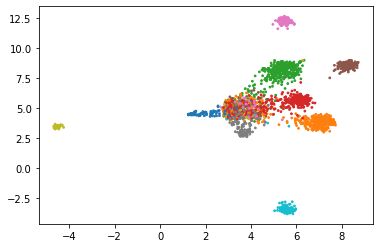

In [16]:
embedding = umap.UMAP().fit_transform(count_lsi)
plt.scatter(embedding[:,0],embedding[:,1],c=label_cat,cmap=cm.tab10, s=3)

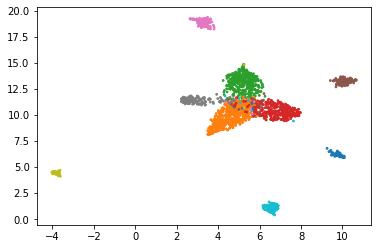

In [15]:
embedding = umap.UMAP().fit_transform(count_lsi.iloc[:,1:30])
plt.scatter(embedding[:,0],embedding[:,1],c=label_cat,cmap=cm.tab10, s=3)

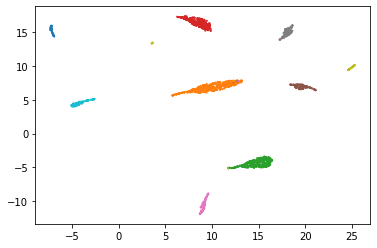

In [13]:
embedding = umap.UMAP().fit_transform(count_lsi.iloc[:,1:10])
plt.scatter(embedding[:,0],embedding[:,1],c=label_cat,cmap=cm.tab10, s=1)

<AxesSubplot:>

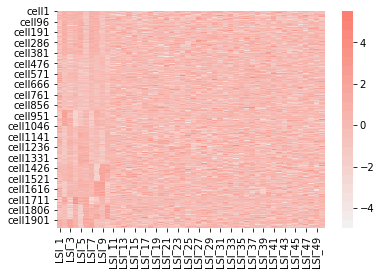

In [17]:
sns.heatmap(count_lsi, cmap=sns.light_palette("salmon", 24))

In [18]:
S_lsi = sklearn.metrics.pairwise.cosine_similarity(count_lsi.iloc[:,1:10])

In [ ]:
# plt.figure(figsize=(24, 24))
sns.heatmap(S_lsi, cmap=sns.light_palette("salmon", 24),square=True)

<AxesSubplot:>

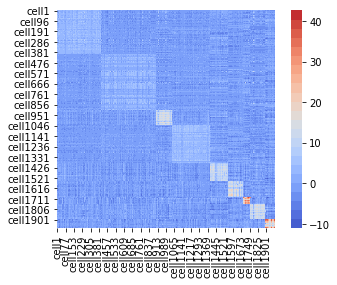

In [53]:
sns.heatmap(count_lsi.iloc[:,1:10] @ count_lsi.iloc[:,1:10].T, cmap=sns.color_palette("coolwarm", 24),square=True)

In [6]:
S_lsi_dot = count_lsi.iloc[:,1:10] @ count_lsi.iloc[:,1:10].T

In [29]:
S_lsi_dot = S_lsi_dot.to_numpy()

<AxesSubplot:>

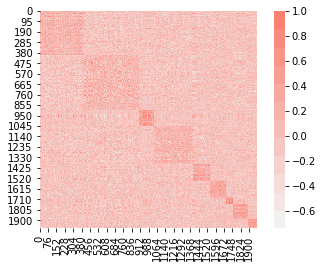

In [13]:
sns.heatmap(S_lsi, cmap=sns.light_palette("salmon", 12),square=True)

<AxesSubplot:>

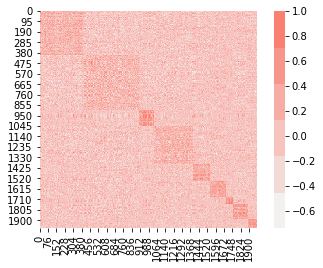

In [14]:
sns.heatmap(S_lsi, cmap=sns.light_palette("salmon", 6),square=True)

In [21]:
count_lsi_peak = pd.read_csv("/home/naoto/scOpen/simATAC/Results/Buenrostro2018/v1.0/count_sim_bin_peak_lsi.tsv", sep="\t")

In [ ]:
[4,5,6,8,9]

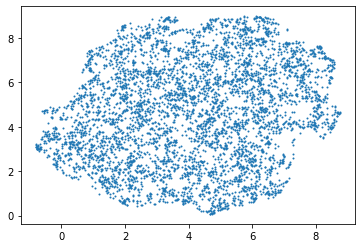

In [86]:
embedding = umap.UMAP().fit_transform(count_lsi_peak.iloc[:,[4,5,6,8,9]])
plt.scatter(embedding[:,0],embedding[:,1], s=1)

<AxesSubplot:>

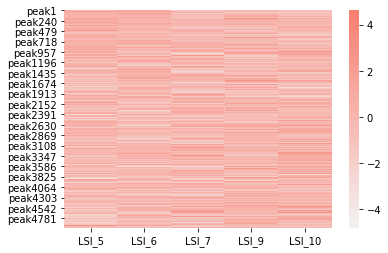

In [87]:
sns.heatmap(count_lsi_peak.iloc[:,[4,5,6,8,9]], cmap=sns.light_palette("salmon", 24))

In [22]:
S_lsi_peak = sklearn.metrics.pairwise.cosine_similarity(count_lsi_peak.iloc[:,[4,5,6,8,9]])

In [89]:
pd.DataFrame(S_lsi_peak)

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,1.000000,0.989626,0.994122,0.993502,0.974317,0.966754,0.983645,0.873310,0.974893,0.976089,...,0.294554,0.187310,0.284863,-0.287143,-0.669131,0.168687,-0.272152,-0.476357,-0.924751,-0.832113
1,0.989626,1.000000,0.998249,0.988406,0.973740,0.954775,0.983149,0.926636,0.995009,0.941264,...,0.251725,0.307800,0.169552,-0.265511,-0.681276,0.105347,-0.316503,-0.518919,-0.918696,-0.763224
2,0.994122,0.998249,1.000000,0.991047,0.974128,0.967009,0.982481,0.910445,0.987399,0.958407,...,0.251457,0.267585,0.201660,-0.280503,-0.698154,0.134395,-0.270411,-0.535034,-0.906664,-0.785265
3,0.993502,0.988406,0.991047,1.000000,0.993539,0.964199,0.992959,0.881397,0.975766,0.962267,...,0.219772,0.267843,0.269478,-0.187988,-0.677899,0.099354,-0.247465,-0.474084,-0.918140,-0.773021
4,0.974317,0.973740,0.974128,0.993539,1.000000,0.947663,0.990562,0.877586,0.964088,0.935194,...,0.152964,0.341956,0.259386,-0.087025,-0.673013,0.032172,-0.230412,-0.455718,-0.905164,-0.706258
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.168687,0.105347,0.134395,0.099354,0.032172,0.311649,0.139966,0.116705,0.062108,0.279555,...,0.798019,-0.507898,0.680526,-0.822445,-0.503289,1.000000,0.130676,-0.428614,-0.043574,-0.444644
4996,-0.272152,-0.316503,-0.270411,-0.247465,-0.230412,-0.087428,-0.287895,-0.412258,-0.397086,-0.101132,...,-0.481204,-0.242827,0.178465,0.179300,-0.224752,0.130676,1.000000,-0.324385,0.583815,0.219022
4997,-0.476357,-0.518919,-0.535034,-0.474084,-0.455718,-0.650876,-0.487691,-0.625644,-0.484548,-0.505599,...,-0.094518,-0.309649,-0.035817,0.441152,0.916785,-0.428614,-0.324385,1.000000,0.170967,0.256507
4998,-0.924751,-0.918696,-0.906664,-0.918140,-0.905164,-0.816869,-0.923208,-0.823406,-0.934146,-0.848288,...,-0.390752,-0.213154,-0.245799,0.202917,0.414069,-0.043574,0.583815,0.170967,1.000000,0.772906


<AxesSubplot:>

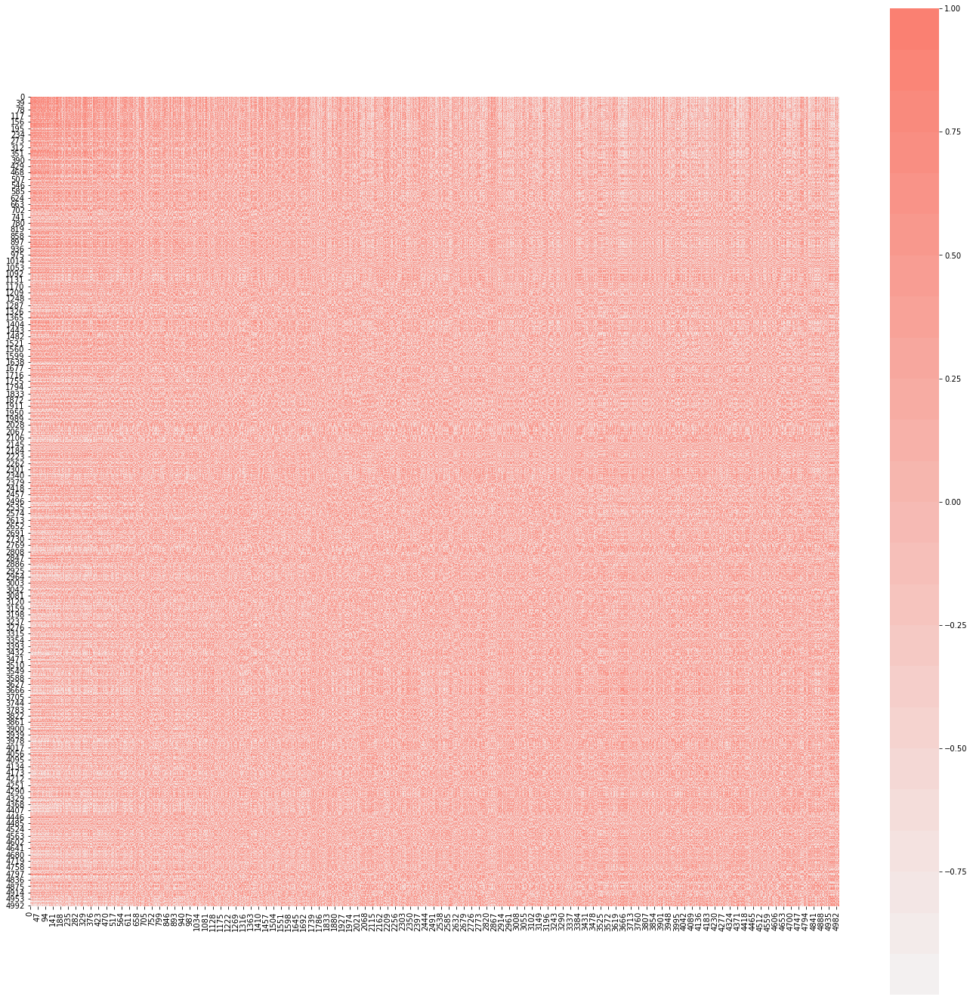

In [90]:
plt.figure(figsize=(24, 24))
sns.heatmap(S_lsi_peak, cmap=sns.light_palette("salmon", 24), square=True)

### 真のpeak-by-cellのjaccard indexならどうか？

In [21]:
M_bin.shape

(5000, 1974)

In [54]:
jaccard_score(M_bin[:,1].T, M_bin[:,1].T)

1.0

In [58]:
jsim = 1 - pdist(M_bin.T, metric="jaccard")

In [33]:
pd.DataFrame(jsim)

,0
0,0.225675
1,0.193160
2,0.228606
3,0.229982
4,0.098525
...,...
1947346,0.107856
1947347,0.136380
1947348,0.090021
1947349,0.117316


In [53]:
jsim[3944]

0.378429774517794

In [56]:
m=5000
n=1974

In [57]:
S_M_jac = np.zeros((n,n)).astype(float)
S_M_jac

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [60]:
for i in range(n):
    for j in range(n):
        if i == j:
            S_M_jac[i,j] = 1
        if i < j:
            idx = n * i + j - ((i + 2) * (i + 1)) // 2
#             print(jsim[idx])
            S_M_jac[i,j] = jsim[idx]
        if i> j:
            S_M_jac[i,j] = S_M_jac[j,i]

In [61]:
pd.DataFrame(S_M_jac)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1.000000,0.225614,0.191325,0.226375,0.227547,0.096471,0.139266,0.191964,0.236169,0.225270,...,0.150000,0.147287,0.204135,0.110294,0.127001,0.138731,0.091477,0.093390,0.154762,0.210119
1,0.225614,1.000000,0.280804,0.404562,0.403956,0.110143,0.168023,0.279832,0.398621,0.386286,...,0.232187,0.193079,0.312826,0.137907,0.166445,0.168543,0.121024,0.103107,0.184740,0.376356
2,0.191325,0.280804,1.000000,0.292877,0.293103,0.104060,0.165965,0.220369,0.310267,0.282727,...,0.198772,0.163828,0.239960,0.128663,0.139160,0.156143,0.111978,0.100239,0.167492,0.276845
3,0.226375,0.404562,0.292877,1.000000,0.414877,0.114611,0.186505,0.281760,0.425165,0.397584,...,0.229010,0.200627,0.313714,0.131483,0.179230,0.168046,0.125790,0.113195,0.191449,0.370370
4,0.227547,0.403956,0.293103,0.414877,1.000000,0.113945,0.176930,0.289910,0.432371,0.407817,...,0.239771,0.193887,0.317825,0.128422,0.172238,0.177947,0.119843,0.106568,0.192212,0.375393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969,0.138731,0.168543,0.156143,0.168046,0.177947,0.077698,0.122268,0.144192,0.179583,0.180124,...,0.170124,0.155222,0.175228,0.118347,0.126472,1.000000,0.106762,0.096947,0.144691,0.200071
1970,0.091477,0.121024,0.111978,0.125790,0.119843,0.073582,0.090602,0.110895,0.121678,0.121877,...,0.121298,0.128289,0.130319,0.096234,0.115974,0.106762,1.000000,0.096282,0.109272,0.138767
1971,0.093390,0.103107,0.100239,0.113195,0.106568,0.080040,0.066334,0.093939,0.106571,0.099108,...,0.099169,0.113668,0.115085,0.084622,0.103125,0.096947,0.096282,1.000000,0.090336,0.117185
1972,0.154762,0.184740,0.167492,0.191449,0.192212,0.086635,0.124096,0.171528,0.194258,0.193218,...,0.169291,0.141474,0.196682,0.119296,0.130765,0.144691,0.109272,0.090336,1.000000,0.226066


In [62]:
pd.DataFrame(1 - S_M_jac)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,0.000000,0.774386,0.808675,0.773625,0.772453,0.903529,0.860734,0.808036,0.763831,0.774730,...,0.850000,0.852713,0.795865,0.889706,0.872999,0.861269,0.908523,0.906610,0.845238,0.789881
1,0.774386,0.000000,0.719196,0.595438,0.596044,0.889857,0.831977,0.720168,0.601379,0.613714,...,0.767813,0.806921,0.687174,0.862093,0.833555,0.831457,0.878976,0.896893,0.815260,0.623644
2,0.808675,0.719196,0.000000,0.707123,0.706897,0.895940,0.834035,0.779631,0.689733,0.717273,...,0.801228,0.836172,0.760040,0.871337,0.860840,0.843857,0.888022,0.899761,0.832508,0.723155
3,0.773625,0.595438,0.707123,0.000000,0.585123,0.885389,0.813495,0.718240,0.574835,0.602416,...,0.770990,0.799373,0.686286,0.868517,0.820770,0.831954,0.874210,0.886805,0.808551,0.629630
4,0.772453,0.596044,0.706897,0.585123,0.000000,0.886055,0.823070,0.710090,0.567629,0.592183,...,0.760229,0.806113,0.682175,0.871578,0.827762,0.822053,0.880157,0.893432,0.807788,0.624607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969,0.861269,0.831457,0.843857,0.831954,0.822053,0.922302,0.877732,0.855808,0.820417,0.819876,...,0.829876,0.844778,0.824772,0.881653,0.873528,0.000000,0.893238,0.903053,0.855309,0.799929
1970,0.908523,0.878976,0.888022,0.874210,0.880157,0.926418,0.909398,0.889105,0.878322,0.878123,...,0.878702,0.871711,0.869681,0.903766,0.884026,0.893238,0.000000,0.903718,0.890728,0.861233
1971,0.906610,0.896893,0.899761,0.886805,0.893432,0.919960,0.933666,0.906061,0.893429,0.900892,...,0.900831,0.886332,0.884915,0.915378,0.896875,0.903053,0.903718,0.000000,0.909664,0.882815
1972,0.845238,0.815260,0.832508,0.808551,0.807788,0.913365,0.875904,0.828472,0.805742,0.806782,...,0.830709,0.858526,0.803318,0.880704,0.869235,0.855309,0.890728,0.909664,0.000000,0.773934


In [64]:
pd.DataFrame(1 / (1 - S_M_jac + 1))

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1.000000,0.563575,0.552891,0.563817,0.564190,0.525340,0.537422,0.553086,0.566948,0.563466,...,0.540541,0.539749,0.556835,0.529183,0.533903,0.537268,0.523965,0.524491,0.541935,0.558696
1,0.563575,1.000000,0.581667,0.626787,0.626549,0.529141,0.545859,0.581338,0.624462,0.619689,...,0.565671,0.553428,0.592707,0.537030,0.545389,0.546013,0.532205,0.527178,0.550885,0.615898
2,0.552891,0.581667,1.000000,0.585781,0.585859,0.527443,0.545246,0.561914,0.591810,0.582319,...,0.555177,0.544611,0.568169,0.534377,0.537392,0.542342,0.529655,0.526382,0.545700,0.580331
3,0.563817,0.626787,0.585781,1.000000,0.630866,0.530395,0.551422,0.581991,0.634987,0.624058,...,0.564656,0.555749,0.593019,0.535184,0.549218,0.545865,0.533558,0.529996,0.552929,0.613636
4,0.564190,0.626549,0.585859,0.630866,1.000000,0.530207,0.548525,0.584764,0.637906,0.628068,...,0.568108,0.553675,0.594469,0.534309,0.547117,0.548832,0.531870,0.528142,0.553162,0.615533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969,0.537268,0.546013,0.542342,0.545865,0.548832,0.520210,0.532557,0.538849,0.549325,0.549488,...,0.546485,0.542071,0.548014,0.531448,0.533752,1.000000,0.528195,0.525471,0.538994,0.555577
1970,0.523965,0.532205,0.529655,0.533558,0.531870,0.519098,0.523725,0.529351,0.532390,0.532447,...,0.532283,0.534271,0.534851,0.525275,0.530778,0.528195,1.000000,0.525288,0.528897,0.537278
1971,0.524491,0.527178,0.526382,0.529996,0.528142,0.520844,0.517152,0.524642,0.528142,0.526069,...,0.526086,0.530129,0.530528,0.522090,0.527183,0.525471,0.525288,1.000000,0.523652,0.531120
1972,0.541935,0.550885,0.545700,0.552929,0.553162,0.522640,0.533076,0.546905,0.553789,0.553470,...,0.546237,0.538061,0.554533,0.531716,0.534978,0.538994,0.528897,0.523652,1.000000,0.563719


<AxesSubplot:>

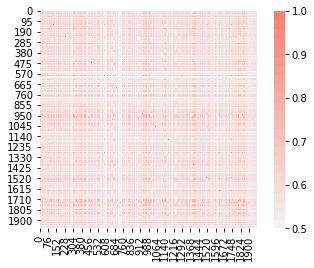

In [65]:
sns.heatmap(1 / (1 - S_M_jac + 1), cmap=sns.light_palette("salmon", 24), square=True)

## GRNMF

In [14]:
def GRNMF(X, A, D, r, lambda1, lambda2, lambdaC):
    # input
    # X: peak-by-cell raw matrix (m, n)
    # S_c: cell-cell similarity matirx (n,n):
    
    # A: adjancy matrix
    # D: diagonal matrix
    # L: D - A
    
    # variable
    # W: (m,r)
    # H: (n,r)
    # I: eye(r)

    m = X.shape[0]
    n = X.shape[1]
    W = np.random.rand(m,r)
    H = np.random.rand(n,r)
    I = np.eye(r)
    
    # paremeters
    err = 1e-5
    factor = 1e-9
    max_iter = 100
    errors = []
    
    for _i in range(max_iter):
        if _i % 10 == 0:
            print(_i)
#         print("W")
#         print(W)
        for i in range(m):
            for k in range(r):
                W[i,k] = W[i,k] * (X @ H)[i,k] / ((W @ H.T @ H + lambda1 * W)[i,k] + factor)

#         print("H")
#         print(H)
        for j in range(n):
            for k in range(r):
                H[j,k] = H[j,k] * (X.T @ W + lambdaC * A @ H)[j,k] / ((H @ W.T @ W + lambda2 * H + lambdaC * D @ H)[j,k] + factor)

#         error = np.mean(np.mean(np.abs(A - H @ W.T))) / np.mean(np.mean(A))
        error = np.linalg.norm(X - W @ H.T, "fro")
        # + lambda1 * np.linalg.norm(W, "fro") + lambda2 * np.linalg.norm(H, "fro") + lambdaC * np.linalg.norm(S_c - H.T @ H, "fro")
        errors.append(error)
        
        if error < err:
            break
    return W @ H.T, W, H, errors
#     WH =  W @ H.T
#     WH_pos = np.where(WH < 0, 0, WH)
#     print("Imputing...")
#     AA = X.astype(float)
#     for i in range(m):
#         if i % 100 == 0:
#             print(i)
#         for j in range(n):
#             if X[i,j] == 0:
#                 AA[i,j] = WH_pos[i,j]
#     return AA, W, H, errors

In [20]:
nbrs = NearestNeighbors(n_neighbors=50, algorithm='ball_tree', metric="euclidean").fit(count_lsi.iloc[:,0:10])
distances, indices = nbrs.kneighbors(count_lsi.iloc[:,0:10])

In [21]:
A = np.zeros((X.shape[1],X.shape[1]))
for i in range(A.shape[0]):
    for j in range(A.shape[1]):
        if j in indices[i]:
            A[i,j] = S_lsi[i,j]

In [24]:
D = np.diag(A.sum(axis=1))

In [25]:
WH,W,H,errors = GRNMF(X, A, D, 9, 1, 1, 0)

0


KeyboardInterrupt: 

In [ ]:
WH_S,W_S,H_S,errors_S = GRNMF(X, A, D, 9, 1, 1, 1)

In [ ]:
plt.plot(errors)
plt.plot(errors_S)

## NHMF

In [118]:
X[:,:] * (1 / (1 - 0.9))

array([[10., 10., 10., ...,  0., 10., 10.],
       [ 0.,  0.,  0., ..., 10., 10., 10.],
       [ 0.,  0.,  0., ..., 10.,  0., 10.],
       ...,
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0., 10., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [15]:
def CMF_Impute(X, S_c, r, lambda1, lambda2, lambdaC, positive=False):
    # input
    # X: peak-by-cell raw matrix (m, n)
    # S_c: cell-cell similarity matirx (n,n)
    
    # variable
    # W: (m,r)
    # H: (n,r)
    # I: eye(r)
    #r = int(n / _n)
    #X = X[:,:] * (1 / (1 - 0.9))
    #X = X * (1 / (1 - drop_rates_real))
#     X = scaling(X)

#     W, H = nndsvd_init(X,r)
    m = X.shape[0]
    n = X.shape[1]
    W = np.random.rand(m,r)
    H = np.random.rand(n,r)
    I = np.eye(r)
    
    # paremeters
    err = 1e-5
    max_iter = 300
    errors = []
    
    for _i in range(max_iter):
#         if _i % 100 == 0:
#             print(_i)

        W = (X @ H) @ np.linalg.inv(H.T @ H + lambda1 * I)
        if positive:
            W[W < 0] = 0
        H = (X.T @ W + lambdaC * S_c @ H) @ np.linalg.inv(W.T @ W + lambda2 * I + lambdaC * H.T @ H)
        if positive:
            H[H < 0] = 0

#         error = np.mean(np.mean(np.abs(A - H @ W.T))) / np.mean(np.mean(A))
        error = np.linalg.norm(X - W @ H.T, "fro")
        # + lambda1 * np.linalg.norm(W, "fro") + lambda2 * np.linalg.norm(H, "fro") + lambdaC * np.linalg.norm(S_c - H.T @ H, "fro")
        errors.append(error)
        
        if error < err:
            break
    return W @ H.T, W, H, errors
#     WH =  W @ H.T
#     WH_pos = np.where(WH < 0, 0, WH)
#     print("Imputing...")
#     AA = X.astype(float)
#     for i in range(m):
#         if i % 100 == 0:
#             print(i)
#         for j in range(n):
#             if X[i,j] == 0:
#                 AA[i,j] = WH_pos[i,j]
#     return AA, W, H, errors

In [96]:
# neigh = NearestNeighbors(n_neighbors=10,
#                              algorithm='auto',
#                              n_jobs=-1, metric='jaccard')

In [97]:
# neigh.fit(np.transpose(X))

In [98]:
# indices = neigh.kneighbors(return_distance=False)
# indices.shape

In [99]:
# rho, dt = compute_rho_by_knn(X, 20)

In [100]:
# rho

In [101]:
# s_sum_real = X.sum(axis=0)
# s_max_real = max(s_sum_real)
# s_min_real = min(s_sum_real)
# max_rate = 0.5

# def calc_drop_rate_real(s_j):
#     return max_rate * (math.log(s_max_real) - math.log(s_j)) / (math.log(s_max_real) - math.log(s_min_real))

In [102]:
# drop_rates_real = np.array(list(map(calc_drop_rate_real, s_sum_real)))
# drop_rates_real

In [103]:
# X * (1 / (1 - drop_rates_real))

In [104]:
# X * (1 / (1 - 0.9))

In [218]:
S_lsi_p = (S_lsi + 1) / 2

In [26]:
WH, W, H, errors = CMF_Impute(X, S_lsi, 30, 1,1,0, False)

In [19]:
WH_S, W_S, H_S, errors_S = CMF_Impute(X, S_lsi, 30, 1,1,1, False)

In [23]:
pd.DataFrame(X).to_csv("hoge.tsv", sep="\t")
!scopen --input hoge.tsv --input-format dense --output-dir ./ --output-prefix hoge_scOpen --output-format dense --n-components 50          
SO_H = pd.read_csv("hoge_scOpen_barcodes.txt", sep="\t", index_col=0).to_numpy()

Number of peaks: 5000; number of cells 1974
Sparsity before imputation: 0.8116187436676798
Sparsity after imputation: 2.8368794325883684e-06
[total time:  0h 0m 13s ]


<AxesSubplot:>

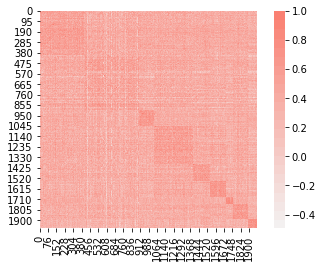

In [27]:
S_h = sklearn.metrics.pairwise.cosine_similarity(H)
sns.heatmap(S_h, cmap=sns.light_palette("salmon", 24), square=True)

Text(0.5, 1.0, 'cos similarity of matrix H (lambdaC=0)')

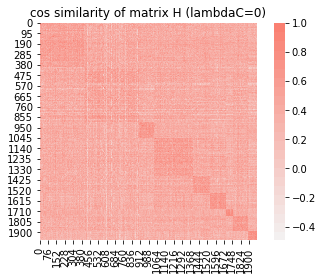

In [30]:
ax = plt.axes()
sns.heatmap(S_h, cmap=sns.light_palette("salmon", 24), square=True, ax=ax)
ax.set_title("cos similarity of matrix H (lambdaC=0)")

Text(0.5, 1.0, 'cos similarity of matrix H (lambdaC=1)')

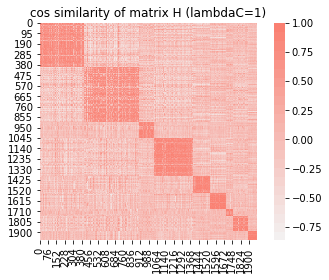

In [29]:
ax = plt.axes()
sns.heatmap(S_hs, cmap=sns.light_palette("salmon", 24), square=True, ax=ax)
ax.set_title("cos similarity of matrix H (lambdaC=1)")

AttributeError: module 'seaborn' has no attribute 'title'

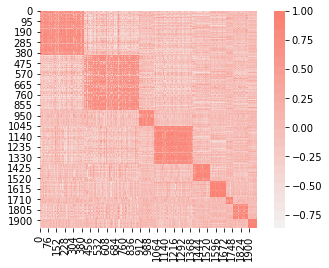

In [28]:
S_hs = sklearn.metrics.pairwise.cosine_similarity(H_S)


<AxesSubplot:>

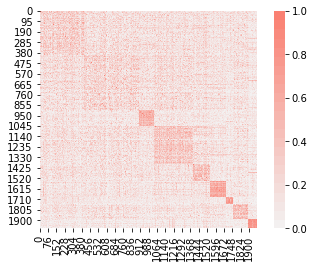

In [24]:
S_hs = sklearn.metrics.pairwise.cosine_similarity(SO_H.T)
sns.heatmap(S_hs, cmap=sns.light_palette("salmon", 24), square=True)

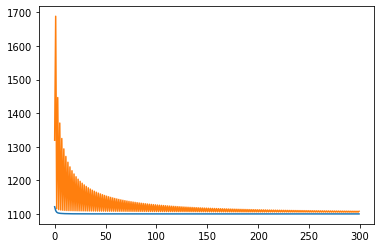

In [35]:
plt.plot(errors)
plt.plot(errors_S)

<AxesSubplot:>

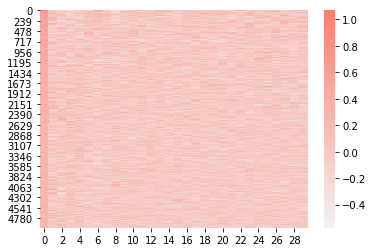

In [176]:
sns.heatmap(W, cmap=sns.light_palette("salmon", 24))

<AxesSubplot:>

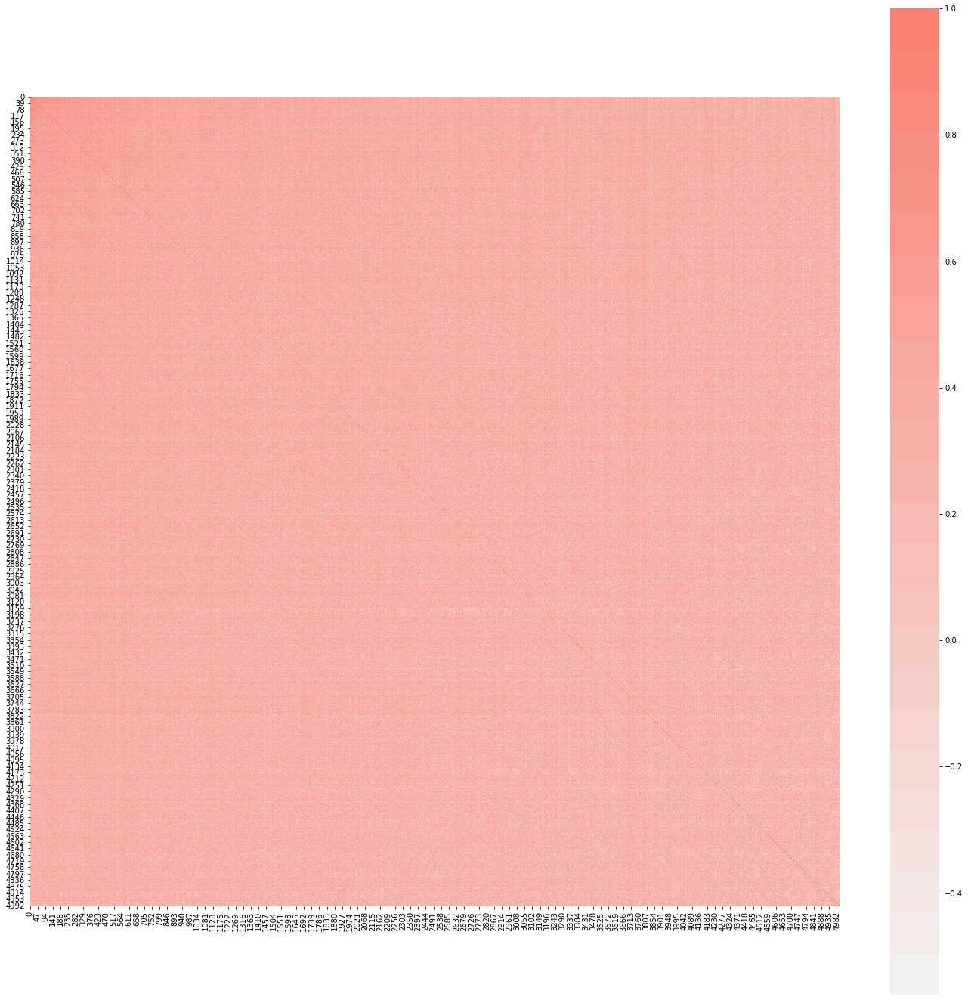

In [177]:
plt.figure(figsize=(24, 24))
S_w = sklearn.metrics.pairwise.cosine_similarity(W)
sns.heatmap(S_w, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

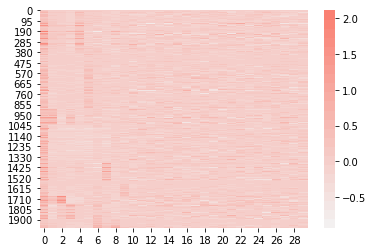

In [178]:
sns.heatmap(H, cmap=sns.light_palette("salmon", 24))

<AxesSubplot:>

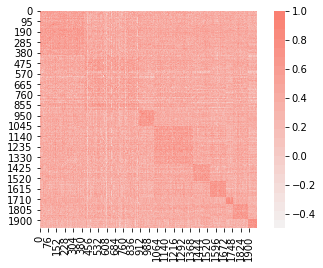

In [36]:
S_h = sklearn.metrics.pairwise.cosine_similarity(H)
sns.heatmap(S_h, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

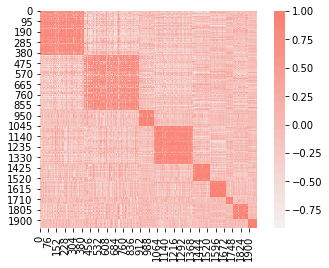

In [37]:
S_hs = sklearn.metrics.pairwise.cosine_similarity(H_S)
sns.heatmap(S_hs, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

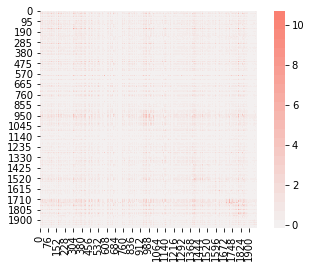

In [40]:
sns.heatmap(H @ H.T, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

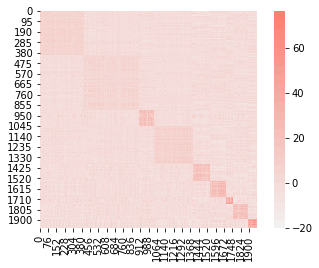

In [39]:
sns.heatmap(H_S @ H_S.T, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

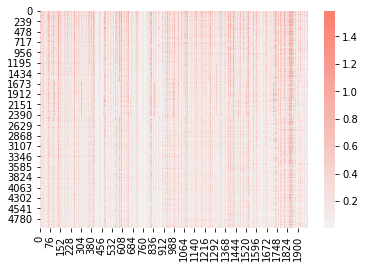

In [223]:
sns.heatmap(WH, cmap=sns.light_palette("salmon", 24))

<AxesSubplot:>

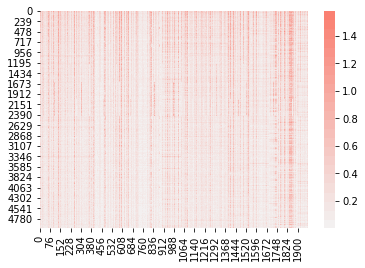

In [224]:
sns.heatmap(WH_S, cmap=sns.light_palette("salmon", 24))

In [54]:
pd.DataFrame(WH)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,0.279093,0.756386,0.478052,0.971241,0.948548,0.187861,0.246501,0.416851,0.961183,0.898762,...,0.649823,0.433318,0.714915,0.255307,0.335227,0.318379,0.198641,0.161438,0.532638,0.995257
1,0.328713,0.846844,0.538107,0.986473,0.877829,0.202806,0.273189,0.506742,0.971802,0.810292,...,0.647103,0.394674,0.648631,0.279791,0.294643,0.286796,0.164353,0.183653,0.550024,1.034778
2,0.298881,0.821981,0.460405,0.977895,0.849473,0.172970,0.265699,0.468013,0.880994,0.857471,...,0.650841,0.409951,0.649368,0.250057,0.301451,0.297758,0.180954,0.174621,0.538762,1.040954
3,0.296639,0.745125,0.464502,1.005727,0.848413,0.174001,0.248656,0.432192,0.996376,0.953364,...,0.654098,0.397600,0.687569,0.256524,0.311071,0.327633,0.199582,0.166533,0.534260,1.035838
4,0.284122,0.755036,0.483310,0.951018,0.888952,0.190029,0.264549,0.486544,1.051496,0.837039,...,0.563403,0.371846,0.575878,0.234294,0.281546,0.287945,0.180324,0.188563,0.491157,0.980924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.054973,0.191388,0.180559,0.157374,0.267735,0.031602,0.060694,0.140831,0.188202,-0.081903,...,0.123790,0.038121,0.183971,0.069900,0.078717,0.029793,0.026198,0.028931,0.080805,0.185238
4996,0.085004,0.364403,0.130265,0.196217,0.152046,0.022680,0.003720,0.037232,0.143500,0.324710,...,0.208536,0.128372,0.249307,0.065102,0.107083,0.100602,0.065951,0.020408,0.158351,0.425542
4997,0.098270,0.184275,0.138375,0.150377,0.198356,0.027943,0.056898,0.141466,0.205188,0.101004,...,0.065214,0.008382,0.097025,0.030176,0.046686,0.021158,0.022580,0.040435,0.024427,0.138494
4998,0.059500,0.081385,0.110728,0.129182,0.082691,0.034626,0.073996,0.078551,0.268970,0.289922,...,0.123625,0.086359,0.143877,0.072615,0.055917,0.048244,0.029215,0.036953,0.070618,0.333806


In [55]:
pd.DataFrame(WH_S)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,0.261662,0.664330,0.454063,0.715491,0.690893,0.307987,0.352388,0.507349,0.767674,0.707730,...,0.897565,0.756687,0.900855,0.518616,0.662726,0.593614,0.524615,0.490848,0.817752,1.069765
1,0.393944,0.752642,0.652429,0.772273,0.692315,0.395348,0.423968,0.667849,0.813650,0.680491,...,0.787109,0.676094,0.753375,0.488627,0.564165,0.553372,0.501157,0.463177,0.730102,0.965753
2,0.350659,0.703944,0.548673,0.737516,0.634152,0.350822,0.416859,0.623070,0.751277,0.636300,...,0.829479,0.700122,0.816531,0.488012,0.610992,0.587753,0.520495,0.474355,0.772828,1.033074
3,0.346821,0.745281,0.542227,0.857846,0.665218,0.316266,0.385308,0.563082,0.912116,0.834512,...,0.786774,0.643016,0.779836,0.456687,0.564003,0.580813,0.482211,0.424014,0.727470,1.009813
4,0.344742,0.712335,0.556872,0.788982,0.757006,0.319028,0.376938,0.570478,0.905765,0.782702,...,0.714721,0.610372,0.705267,0.423325,0.504412,0.536088,0.436417,0.420454,0.697847,0.970592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.001693,0.207432,0.143998,0.144211,0.253329,0.044562,0.064157,0.120699,0.178128,-0.009988,...,0.149550,0.078694,0.199250,0.090332,0.099321,0.038666,0.060332,0.039644,0.086601,0.212083
4996,0.090653,0.294631,0.062413,0.207497,0.076428,-0.010335,-0.006355,0.022987,0.180699,0.332254,...,0.461394,0.340645,0.406103,0.251003,0.298953,0.334982,0.199564,0.166246,0.319834,0.539023
4997,0.127647,0.201681,0.127930,0.126472,0.206142,0.036059,0.055730,0.139841,0.186113,0.136769,...,0.048926,0.026887,0.135186,0.023019,0.042529,0.056295,0.034012,0.029957,0.062814,0.157953
4998,0.062914,0.088561,0.074991,0.157984,0.138432,-0.003837,0.043744,0.055747,0.289349,0.364808,...,0.194183,0.088943,0.146805,0.086347,0.096047,0.077901,0.034422,0.046046,0.058442,0.324339


In [56]:
pd.DataFrame(M_bin)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1
1,1,1,1,1,1,0,1,0,1,1,...,1,1,1,1,1,0,1,1,1,1
2,0,1,1,1,1,0,0,1,1,1,...,1,1,1,0,0,1,1,1,1,1
3,0,1,0,1,1,0,0,1,1,1,...,1,0,1,1,1,0,1,1,1,1
4,1,0,0,1,1,0,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1,1,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4996,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,1
4997,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
4998,0,1,0,0,1,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,1


In [41]:
rmse = mean_squared_error(M_bin, WH, squared=False)
mae = mean_absolute_error(M_bin, WH)
print(rmse, mae)

0.48699153070668594 0.3701291379566314


In [42]:
rmse = mean_squared_error(M_bin, WH_S, squared=False)
mae = mean_absolute_error(M_bin, WH_S)
print(rmse, mae)

0.4901295732301453 0.3730859987209558


In [43]:
m=5000
n=1974 #12178
rr_nhmf = np.sum((M_bin - X) * WH) / np.sum(M_bin - X)
fr_nhmf = (np.sum(WH) - np.sum(M_bin * WH)) / (m * n - np.sum(M_bin))
print(rr_nhmf)
print(fr_nhmf)

0.19492479596354126
0.1363433207772035


In [44]:
rr_nhmf = np.sum((M_bin - X) * WH_S) / np.sum(M_bin - X)
fr_nhmf = (np.sum(WH_S) - np.sum(M_bin * WH_S)) / (m * n - np.sum(M_bin))
print(rr_nhmf)
print(fr_nhmf)

0.19187296759396055
0.1338662204180068


In [45]:
fpr_x, tpr_x, thresholds_x = roc_curve(M_bin.flatten(), X.flatten())
roc_auc_x = auc(fpr_x, tpr_x)

In [46]:
precision_x, recall_x, thresholds_pr_x = precision_recall_curve(M_bin.flatten(), X.flatten())
auprc_x= auc(recall_x, precision_x)
print(auprc_x)

0.5582764120672006


In [47]:
fpr_nhmf, tpr_nhmf, thresholds_nhmf = roc_curve(M_bin.flatten(), WH.flatten())
roc_auc_nhmf = auc(fpr_nhmf, tpr_nhmf)
print(roc_auc_nhmf)

0.724505073014982


In [48]:
fpr_nhmf_S, tpr_nhmf_S, thresholds_nhmf_S = roc_curve(M_bin.flatten(), WH_S.flatten())
roc_auc_nhmf_S = auc(fpr_nhmf_S, tpr_nhmf_S)
print(roc_auc_nhmf_S)

0.710055624205769


In [49]:
precision_nhmf, recall_nhmf, thresholds_pr_nhmf = precision_recall_curve(M_bin.flatten(), WH.flatten())
auprc_nhmf= auc(recall_nhmf, precision_nhmf)
print(auprc_nhmf)

0.6354181624554736


In [50]:
precision_nhmf_S, recall_nhmf_S, thresholds_pr_nhmf_S = precision_recall_curve(M_bin.flatten(), WH_S.flatten())
auprc_nhmf_S= auc(recall_nhmf_S, precision_nhmf_S)
print(auprc_nhmf_S)

0.624501463166524


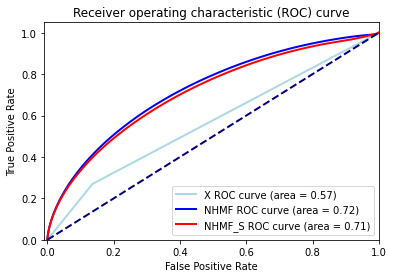

In [51]:
lw = 2
plt.plot(fpr_x, tpr_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % roc_auc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(fpr_nhmf, tpr_nhmf, color='blue', lw=lw, label='NHMF ROC curve (area = %0.2f)' % roc_auc_nhmf)
plt.plot(fpr_nhmf_S, tpr_nhmf_S, color='red', lw=lw, label='NHMF_S ROC curve (area = %0.2f)' % roc_auc_nhmf_S)

#plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

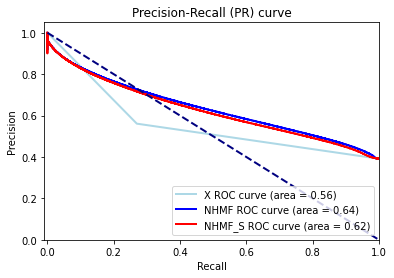

In [52]:
lw = 2
plt.plot(recall_x, precision_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % auprc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(recall_nhmf, precision_nhmf, color='blue', lw=lw, label='NHMF ROC curve (area = %0.2f)' % auprc_nhmf)
plt.plot(recall_nhmf_S, precision_nhmf_S, color='red', lw=lw, label='NHMF_S ROC curve (area = %0.2f)' % auprc_nhmf_S)

#plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [1, 0], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall (PR) curve')
plt.legend(loc="lower right")
plt.show()

In [158]:
AA = X.astype(float)
for i in range(m):
    if i % 100 == 0:
        print(i)
    for j in range(n):
        if X[i,j] == 0 and WH_S[i,j] > 0:
            AA[i,j] = WH_S[i,j]

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900


In [154]:
fpr_nhmf, tpr_nhmf, thresholds_nhmf = roc_curve(M_bin.flatten(), AA.flatten())
roc_auc_nhmf = auc(fpr_nhmf, tpr_nhmf)
print(roc_auc_nhmf)

0.8457389147049472


In [159]:
precision_nhmf, recall_nhmf, thresholds_pr_nhmf = precision_recall_curve(M_bin.flatten(), AA.flatten())
auprc_nhmf= auc(recall_nhmf, precision_nhmf)
print(auprc_nhmf)

0.8062386025274253


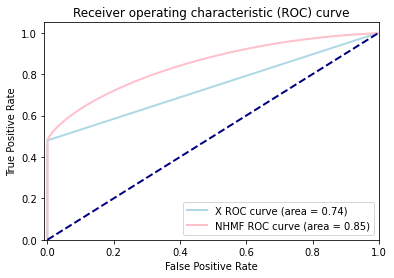

In [156]:
fpr_nhmf, tpr_nhmf, thresholds_nhmf = roc_curve(M_bin.flatten(), AA.flatten())
roc_auc_nhmf = auc(fpr_nhmf, tpr_nhmf)

lw = 2
plt.plot(fpr_x, tpr_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % roc_auc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(fpr_nhmf, tpr_nhmf, color='pink', lw=lw, label='NHMF ROC curve (area = %0.2f)' % roc_auc_nhmf)
#plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

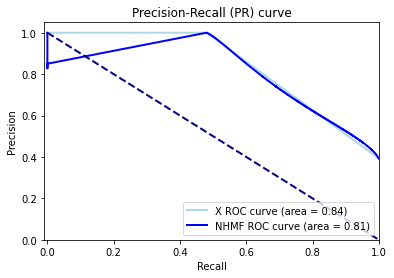

In [160]:
lw = 2
plt.plot(recall_x, precision_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % auprc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(recall_nhmf, precision_nhmf, color='blue', lw=lw, label='NHMF ROC curve (area = %0.2f)' % auprc_nhmf)
# plt.plot(recall_nhmf_S, precision_nhmf_S, color='red', lw=lw, label='NHMF_S ROC curve (area = %0.2f)' % auprc_nhmf_S)

#plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [1, 0], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall (PR) curve')
plt.legend(loc="lower right")
plt.show()

(0.0, 1.0)

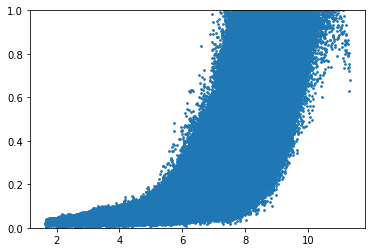

In [56]:
plt.scatter(hoge.flatten(), WH.flatten(), s=3)
plt.ylim([0.0, 1.00])

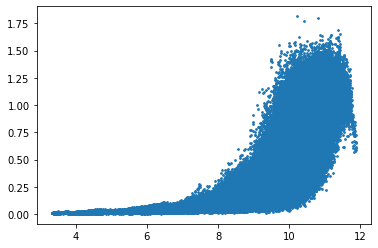

In [42]:
plt.scatter(fuga.flatten(), WH.flatten(), s=3)

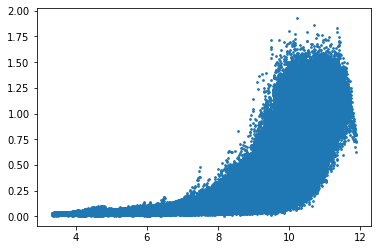

In [55]:
plt.scatter(fuga.flatten(), WH.flatten(), s=3)

## scOpen

In [13]:
pd.DataFrame(X).to_csv("hoge.tsv", sep="\t")

In [51]:
!scopen --input hoge.tsv --input-format dense --output-dir ./ --output-prefix hoge_scOpen --output-format dense --n-components 8          
#SO = pd.read_csv("scOpen/fig_scOpen.txt", sep="\t", index_col=0).to_numpy()

Number of peaks: 5000; number of cells 12178
Sparsity before imputation: 0.9239273608145837
Sparsity after imputation: 0.0002844145179832225
[total time:  0h 1m 19s ]


In [52]:
SO_peak = pd.read_csv("hoge_scOpen_peaks.txt", sep="\t", index_col=0).to_numpy()
SO_bar = pd.read_csv("hoge_scOpen_barcodes.txt", sep="\t", index_col=0).to_numpy()
SO = pd.read_csv("hoge_scOpen.txt", sep="\t", index_col=0).to_numpy()

<AxesSubplot:>

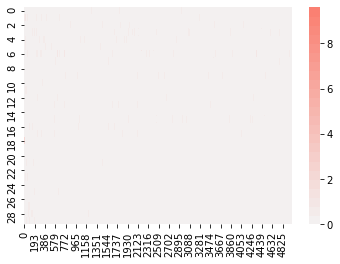

In [16]:
sns.heatmap(SO_peak.T, cmap=sns.light_palette("salmon", 24))

<AxesSubplot:>

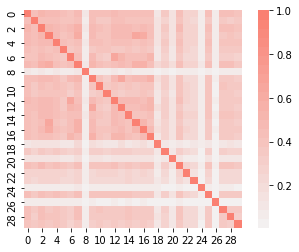

In [17]:
S_w = sklearn.metrics.pairwise.cosine_similarity(SO_peak.T)
sns.heatmap(S_w, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

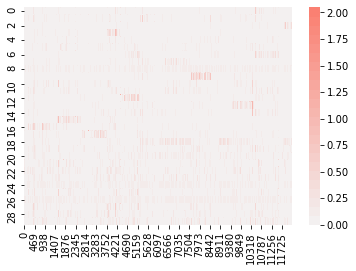

In [18]:
sns.heatmap(SO_bar, cmap=sns.light_palette("salmon", 24))

<AxesSubplot:>

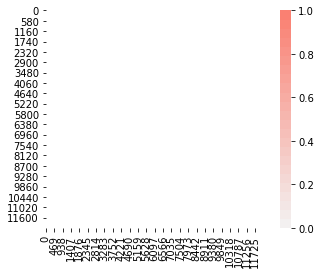

In [19]:
S_h = sklearn.metrics.pairwise.cosine_similarity(SO_bar.T)

<AxesSubplot:>

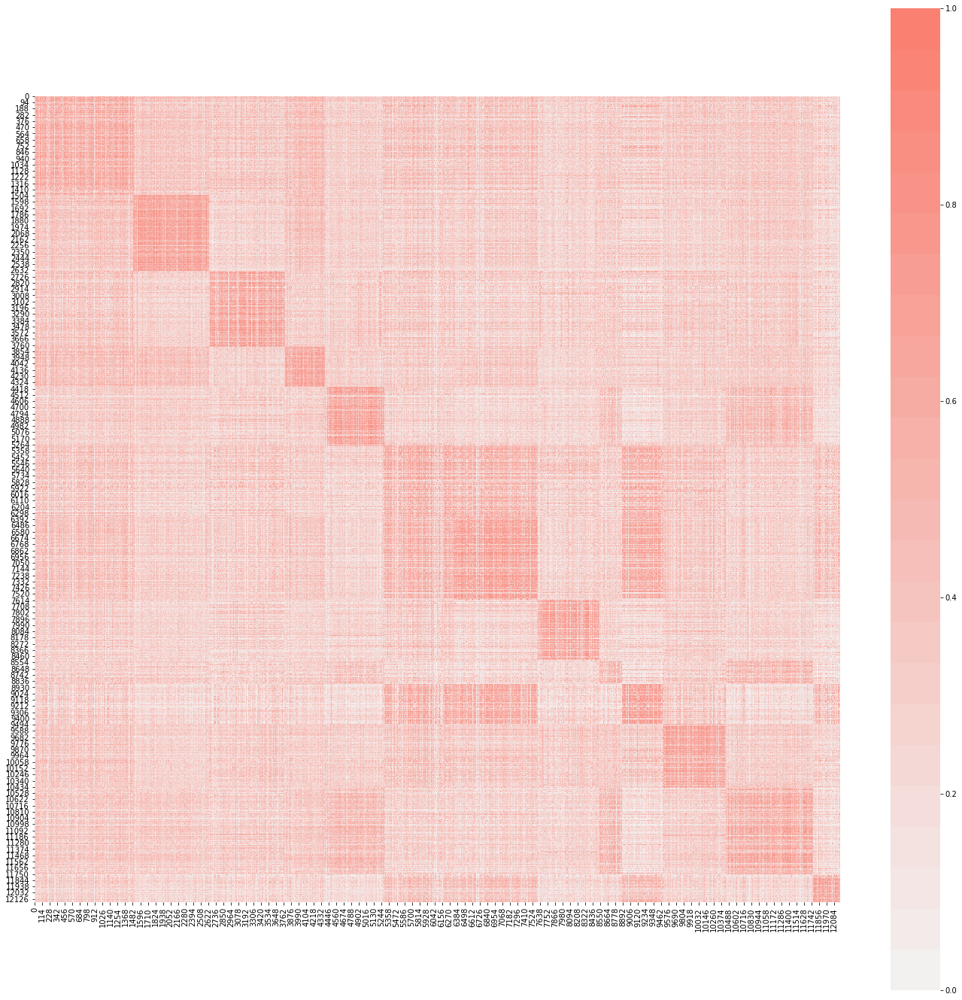

In [26]:
plt.figure(figsize=(24, 24))
sns.heatmap(S_h, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

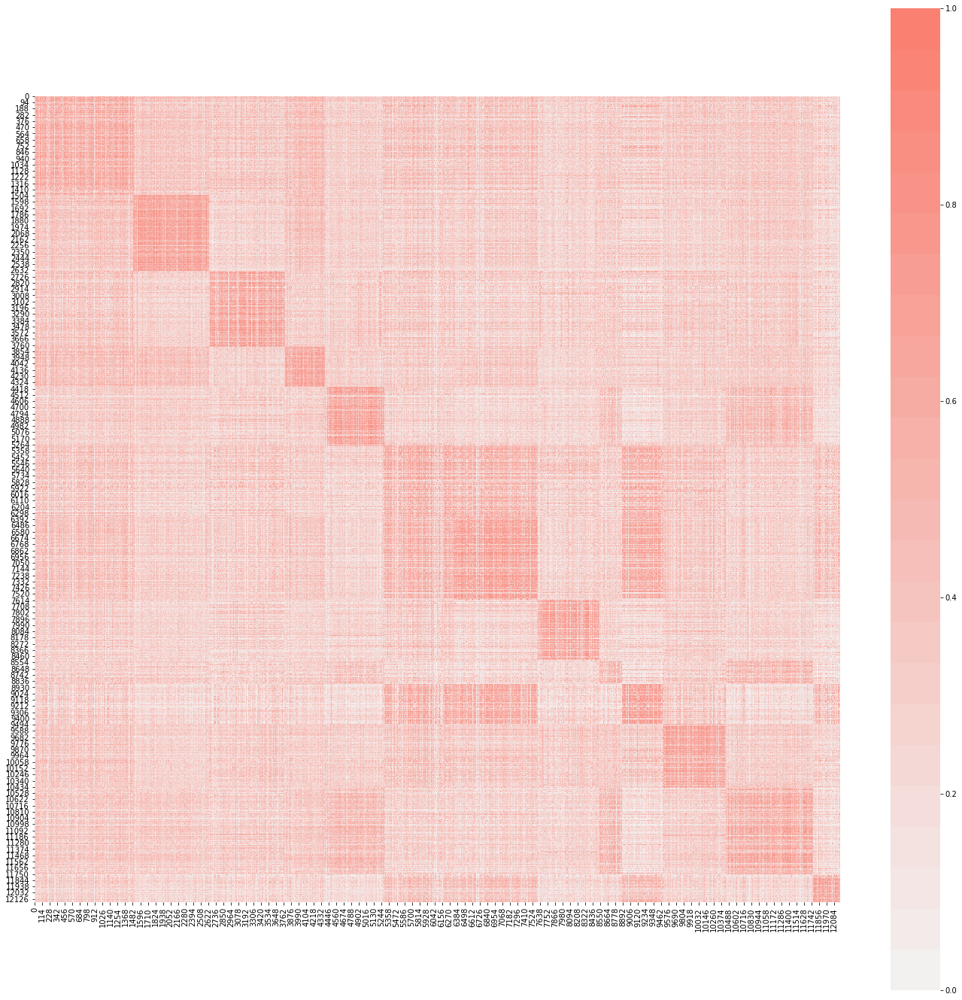

In [53]:
plt.figure(figsize=(24, 24))
sns.heatmap(S_h, cmap=sns.light_palette("salmon", 24), square=True)

<AxesSubplot:>

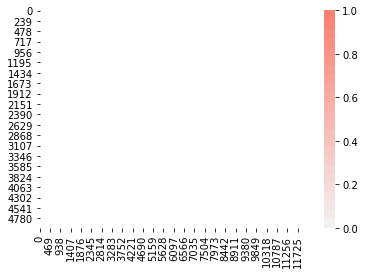

In [20]:
sns.heatmap(SO, cmap=sns.light_palette("salmon", 24))

In [54]:
rmse = mean_squared_error(M_bin, SO, squared=False)
mae = mean_absolute_error(M_bin, SO)
print(rmse, mae)

0.35084694274918676 0.2074571511980737


In [55]:
m=5000
n=12178
rr_so = np.sum((M_bin - X) * SO) / np.sum(M_bin - X)
fr_so = (np.sum(SO) - np.sum(M_bin * SO)) / (m * n - np.sum(M_bin))
print(rr_so)
print(fr_so)

0.15551581625881622
0.06901359741526701


In [56]:
fpr_so, tpr_so, thresholds_so = roc_curve(M_bin.flatten(), SO.flatten())
roc_auc_so = auc(fpr_so, tpr_so)
print(roc_auc_so)

0.7849197049249012


In [57]:
precision_so, recall_so, thresholds_pr_so = precision_recall_curve(M_bin.flatten(), SO.flatten())
auprc_so= auc(recall_so, precision_so)
print(auprc_so)

0.5045741011056576


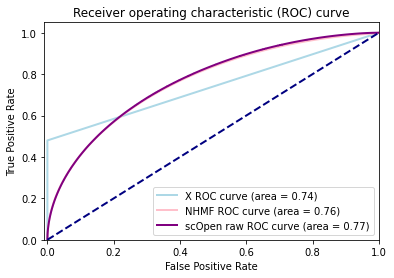

In [43]:
lw = 2
plt.plot(fpr_x, tpr_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % roc_auc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(fpr_nhmf, tpr_nhmf, color='pink', lw=lw, label='NHMF ROC curve (area = %0.2f)' % roc_auc_nhmf)
plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

## TransCF

In [3]:
import torch

In [8]:
file = "../TransCF/data/Buenrostro2018/Buen_item.pkl"
item = torch.load(file, map_location=torch.device('cpu'))
print(item)
# RuntimeError: Attempting to deserialize object on a CUDA device 
#but torch.cuda.is_available() is False. If you are running on a CPU-only machine, 
#please use torch.load with map_location=torch.device('cpu') to map your storages to the CPU.
# GPUでないと開けない？Colbaで再度保存しなおすのはあり

RuntimeError: Attempting to deserialize object on a CUDA device but torch.cuda.is_available() is False. If you are running on a CPU-only machine, please use torch.load with map_location=torch.device('cpu') to map your storages to the CPU.

In [83]:
rating = pd.read_csv("../TransCF/data/Buenrostro2018/Buen_val.csv", index_col=0)
rating

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,-1.706633e-07,-1.603581e-07,-1.509634e-07,-1.508437e-07,-1.556950e-07,-1.604339e-07,-1.406717e-07,-1.670904e-07,-1.881678e-07,-2.184262e-07,...,-0.000192,-0.000031,-0.000119,-0.000078,-0.000082,-0.000124,-0.000103,-0.000048,-0.000049,-0.000036
1,-1.331892e-07,-1.245442e-07,-1.249601e-07,-1.246836e-07,-1.206821e-07,-1.263637e-07,-1.094385e-07,-1.309952e-07,-1.423427e-07,-1.722701e-07,...,-0.000199,-0.000028,-0.000115,-0.000081,-0.000086,-0.000123,-0.000102,-0.000051,-0.000049,-0.000037
2,-1.871336e-07,-1.674865e-07,-1.797356e-07,-1.784648e-07,-1.705088e-07,-1.983587e-07,-1.507885e-07,-1.863477e-07,-2.101812e-07,-1.634162e-07,...,-0.000197,-0.000029,-0.000116,-0.000081,-0.000084,-0.000119,-0.000105,-0.000050,-0.000050,-0.000035
3,-1.621018e-07,-1.596413e-07,-1.644487e-07,-1.744602e-07,-1.609071e-07,-1.462837e-07,-1.721468e-07,-1.671767e-07,-1.855852e-07,-1.937524e-07,...,-0.000201,-0.000026,-0.000114,-0.000080,-0.000085,-0.000128,-0.000104,-0.000051,-0.000050,-0.000039
4,-3.606826e-08,-3.149396e-08,-3.987868e-08,-4.101680e-08,-3.595036e-08,-3.944441e-08,-3.960307e-08,-3.792770e-08,-3.598211e-08,-2.427112e-08,...,-0.000196,-0.000026,-0.000116,-0.000081,-0.000086,-0.000127,-0.000108,-0.000050,-0.000050,-0.000037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969,-1.557557e-07,-1.681880e-07,-1.510652e-07,-1.525886e-07,-1.538687e-07,-1.737562e-07,-1.529620e-07,-1.612778e-07,-1.458973e-07,-2.261977e-07,...,-0.000198,-0.000027,-0.000118,-0.000081,-0.000083,-0.000123,-0.000105,-0.000048,-0.000051,-0.000034
1970,-1.482447e-07,-1.472833e-07,-1.550466e-07,-1.378661e-07,-1.595313e-07,-1.475683e-07,-1.568412e-07,-1.371850e-07,-1.555736e-07,-1.199142e-07,...,-0.000192,-0.000027,-0.000115,-0.000080,-0.000085,-0.000128,-0.000110,-0.000049,-0.000048,-0.000035
1971,-2.647409e-07,-2.627690e-07,-2.748849e-07,-2.641476e-07,-2.744675e-07,-2.726738e-07,-2.691326e-07,-2.774556e-07,-3.065134e-07,-2.723732e-07,...,-0.000191,-0.000029,-0.000121,-0.000076,-0.000081,-0.000128,-0.000108,-0.000046,-0.000047,-0.000035
1972,-1.477061e-07,-1.355226e-07,-1.386517e-07,-1.444240e-07,-1.423761e-07,-1.336995e-07,-1.412016e-07,-1.514051e-07,-1.901127e-07,-1.615448e-07,...,-0.000192,-0.000029,-0.000119,-0.000076,-0.000080,-0.000128,-0.000106,-0.000047,-0.000050,-0.000037


In [84]:
dist = rating * -1
dist

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,1.706633e-07,1.603581e-07,1.509634e-07,1.508437e-07,1.556950e-07,1.604339e-07,1.406717e-07,1.670904e-07,1.881678e-07,2.184262e-07,...,0.000192,0.000031,0.000119,0.000078,0.000082,0.000124,0.000103,0.000048,0.000049,0.000036
1,1.331892e-07,1.245442e-07,1.249601e-07,1.246836e-07,1.206821e-07,1.263637e-07,1.094385e-07,1.309952e-07,1.423427e-07,1.722701e-07,...,0.000199,0.000028,0.000115,0.000081,0.000086,0.000123,0.000102,0.000051,0.000049,0.000037
2,1.871336e-07,1.674865e-07,1.797356e-07,1.784648e-07,1.705088e-07,1.983587e-07,1.507885e-07,1.863477e-07,2.101812e-07,1.634162e-07,...,0.000197,0.000029,0.000116,0.000081,0.000084,0.000119,0.000105,0.000050,0.000050,0.000035
3,1.621018e-07,1.596413e-07,1.644487e-07,1.744602e-07,1.609071e-07,1.462837e-07,1.721468e-07,1.671767e-07,1.855852e-07,1.937524e-07,...,0.000201,0.000026,0.000114,0.000080,0.000085,0.000128,0.000104,0.000051,0.000050,0.000039
4,3.606826e-08,3.149396e-08,3.987868e-08,4.101680e-08,3.595036e-08,3.944441e-08,3.960307e-08,3.792770e-08,3.598211e-08,2.427112e-08,...,0.000196,0.000026,0.000116,0.000081,0.000086,0.000127,0.000108,0.000050,0.000050,0.000037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969,1.557557e-07,1.681880e-07,1.510652e-07,1.525886e-07,1.538687e-07,1.737562e-07,1.529620e-07,1.612778e-07,1.458973e-07,2.261977e-07,...,0.000198,0.000027,0.000118,0.000081,0.000083,0.000123,0.000105,0.000048,0.000051,0.000034
1970,1.482447e-07,1.472833e-07,1.550466e-07,1.378661e-07,1.595313e-07,1.475683e-07,1.568412e-07,1.371850e-07,1.555736e-07,1.199142e-07,...,0.000192,0.000027,0.000115,0.000080,0.000085,0.000128,0.000110,0.000049,0.000048,0.000035
1971,2.647409e-07,2.627690e-07,2.748849e-07,2.641476e-07,2.744675e-07,2.726738e-07,2.691326e-07,2.774556e-07,3.065134e-07,2.723732e-07,...,0.000191,0.000029,0.000121,0.000076,0.000081,0.000128,0.000108,0.000046,0.000047,0.000035
1972,1.477061e-07,1.355226e-07,1.386517e-07,1.444240e-07,1.423761e-07,1.336995e-07,1.412016e-07,1.514051e-07,1.901127e-07,1.615448e-07,...,0.000192,0.000029,0.000119,0.000076,0.000080,0.000128,0.000106,0.000047,0.000050,0.000037


In [217]:
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,0,0,1,1
1,0,0,0,1,1,0,0,1,1,1,...,0,1,1,0,0,1,1,1,1,1
2,0,0,0,1,1,0,0,0,1,1,...,1,0,1,0,0,0,1,1,0,1
3,1,0,0,1,1,0,0,0,1,1,...,0,1,1,0,0,0,0,1,1,1
4,0,0,0,1,1,0,0,0,1,1,...,1,1,1,1,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4996,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4997,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4998,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
XX = X.astype(float)
for cell_i in range(X.shape[1]):
    print(cell_i)
    hoge = X[:,cell_i]
    one_idx = list(np.where(hoge==1)[0].astype(str))
    print("# of peaks in X of cell_i: ", len(one_idx))
    rankls = dist.iloc[cell_i,:].sort_values(ascending=True)
    rankls_df = pd.DataFrame(rankls)
    rankls_df = rankls_df.reset_index()
    peak_idx_in_rankls = []
    for idx in one_idx:
        peak_idx_in_rankls.append(rankls_df[rankls_df["index"] == idx].index[0])
    mx_idx = max(peak_idx_in_rankls)
    f = lambda x: (x - hoge.loc[mx_idx,cell_i]) / (hoge.loc[0, cell_i] - hoge.loc[mx_idx,cell_i])
    hoge = rankls_df[0:mx_idx+1]
    hoge["val"] = hoge[cell_i].map(f)
#     print(hoge)
    for impute_i in hoge["index"]:
        if X[int(impute_i), cell_i] == 0:
            XX[int(impute_i), cell_i] = hoge[hoge["index"]==impute_i]["val"].values[0]
#             print(XX[int(impute_i), cell_i])

0
# of peaks in X of cell_i:  504


/usr/local/package/python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


1
# of peaks in X of cell_i:  1259
2
# of peaks in X of cell_i:  735
3
# of peaks in X of cell_i:  1342
4
# of peaks in X of cell_i:  1349
5
# of peaks in X of cell_i:  198
6
# of peaks in X of cell_i:  398
7
# of peaks in X of cell_i:  645
8
# of peaks in X of cell_i:  1461
9
# of peaks in X of cell_i:  1295
10
# of peaks in X of cell_i:  530
11
# of peaks in X of cell_i:  1618
12
# of peaks in X of cell_i:  1016
13
# of peaks in X of cell_i:  1779
14
# of peaks in X of cell_i:  713
15
# of peaks in X of cell_i:  705
16
# of peaks in X of cell_i:  771
17
# of peaks in X of cell_i:  251
18
# of peaks in X of cell_i:  400
19
# of peaks in X of cell_i:  1177
20
# of peaks in X of cell_i:  736
21
# of peaks in X of cell_i:  1353
22
# of peaks in X of cell_i:  2189
23
# of peaks in X of cell_i:  1405
24
# of peaks in X of cell_i:  752
25
# of peaks in X of cell_i:  1408
26
# of peaks in X of cell_i:  1328
27
# of peaks in X of cell_i:  1780
28
# of peaks in X of cell_i:  2795
29
# of peaks

In [ ]:
rmse = mean_squared_error(M_bin, XX, squared=False)
mae = mean_absolute_error(M_bin, XX)
print(rmse, mae)

In [ ]:
m=5000
n=1974
rr_xx = np.sum((M_bin - X) * XX) / np.sum(M_bin - X)
fr_xx = (np.sum(WH) - np.sum(M_bin * XX)) / (m * n - np.sum(M_bin))
print(rr_xx)
print(fr_xx)

In [ ]:
fpr_xx, tpr_xx, thresholds_xx = roc_curve(M_bin.flatten(), XX.flatten())
roc_auc_xx = auc(fpr_xx, tpr_xx)

In [ ]:
lw = 2
plt.plot(fpr_xx, tpr_xx, color='lightblue', lw=lw, label='XX ROC curve (area = %0.2f)' % roc_auc_xx)
# plt.plot(fpr_x, tpr_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % roc_auc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
# plt.plot(fpr_nhmf, tpr_nhmf, color='pink', lw=lw, label='NHMF ROC curve (area = %0.2f)' % roc_auc_nhmf)
# plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='scOpen raw ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

## TransCF試し

In [5]:
with open("../TransCF/deli_user.pkl", mode="rb") as f:
    user = pickle.load(f, encoding='latin').numpy()
    print(user)

[[-0.00834454 -0.00428865  0.00751974 ... -0.00494835 -0.00443936
   0.00196495]
 [ 0.00256291 -0.00069065 -0.00164546 ... -0.0065546  -0.00114174
   0.01430733]
 [ 0.00278844 -0.00304645  0.00488212 ... -0.00525524  0.0012445
  -0.00108705]
 ...
 [-0.00111145  0.00596036  0.01341672 ... -0.0004789  -0.00166906
   0.00732349]
 [-0.00270539 -0.01348097 -0.00353705 ... -0.0033234   0.01000617
   0.00680515]
 [-0.00133968  0.0095127  -0.00994604 ... -0.00579895  0.0022796
  -0.00488641]]


In [6]:
import pandas as pd
pd.DataFrame(item)

,0,1,2,3,4,5,6,7,8,9
0,-0.012599,-0.008773,0.001676,-0.002630,-0.002354,-0.008489,-0.003383,-0.015684,-0.008971,0.009640
1,-0.002791,-0.000518,0.002735,-0.005558,0.002508,-0.004684,-0.000756,-0.000904,0.003805,0.001970
2,-0.012056,-0.003330,0.009656,0.006506,0.003816,0.002114,-0.000276,-0.002308,0.002638,-0.010180
3,-0.002924,-0.001035,-0.001313,-0.000329,-0.001379,0.006286,0.001407,-0.000941,0.003427,-0.005053
4,-0.000732,-0.002736,0.003887,-0.005591,-0.003951,0.003612,0.004056,-0.004291,0.004577,0.002150
...,...,...,...,...,...,...,...,...,...,...
1191,0.001145,0.007697,-0.000433,-0.023082,0.008028,0.004399,0.003569,0.003832,-0.010125,0.001163
1192,-0.013535,0.001508,-0.009078,0.005940,0.003352,-0.002271,-0.003915,-0.003641,0.012679,-0.011257
1193,-0.000430,-0.008813,0.014097,-0.013841,0.003109,-0.016246,0.006608,0.004410,0.007605,-0.009582
1194,0.006058,0.000932,-0.004620,-0.006149,-0.008913,-0.002042,0.018473,0.007577,0.002786,-0.015238


In [21]:
with open("../TransCF/model/itemEmbedding_TransCF_delicious.pkl", mode="rb") as f:
    itemEmbed = pickle.load(f, encoding='latin')#.numpy()
    print(itemEmbed)

[[-0.06137487  0.06321009  0.05796635 ... -0.0915497  -0.09291643
   0.00679023]
 [-0.05702919  0.1173431   0.07533696 ... -0.03794232 -0.01188957
  -0.01711372]
 [-0.01782014  0.1003173   0.12459963 ... -0.08797941 -0.0223725
  -0.01537447]
 ...
 [ 0.01180363 -0.00702114  0.00788039 ... -0.01902248 -0.01246892
   0.00397308]
 [ 0.01006565  0.01618053 -0.00303812 ...  0.00816437 -0.00994194
   0.00791149]
 [-0.0119057  -0.00467951  0.00802883 ...  0.01056892 -0.00758639
   0.00180475]]


In [22]:
with open("../TransCF/model/userEmbedding_TransCF_delicious.pkl", mode="rb") as f:
    userEmbed = pickle.load(f, encoding='latin')#.numpy()
    print(userEmbed)

[[-0.05212022  0.08106874  0.10135972 ... -0.17525278 -0.04241925
  -0.01933861]
 [ 0.15423952  0.03129944  0.00077201 ...  0.01367662  0.07997753
  -0.17244864]
 [-0.00277744  0.12293323  0.0152929  ...  0.11421302 -0.070309
  -0.09657824]
 ...
 [ 0.08559965  0.05185874 -0.0714073  ... -0.00821149 -0.02455372
   0.09723356]
 [-0.06638564  0.02248659  0.07769361 ... -0.12324353 -0.02122968
  -0.00757941]
 [ 0.0154183  -0.06923873  0.15496774 ...  0.04995516  0.10256982
   0.03434199]]


In [9]:
pd.DataFrame(item_deli)

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,-0.061375,0.063210,0.057966,0.007885,-0.005443,-0.062254,0.193407,0.037658,0.051860,-0.159253,...,-0.006468,-0.066387,-0.050790,0.025931,-0.065091,0.017027,0.067575,-0.091550,-0.092916,0.006790
1,-0.057029,0.117343,0.075337,-0.022386,-0.044053,-0.086684,0.076375,0.042188,0.057590,-0.159037,...,-0.097181,-0.119629,0.015556,0.030026,0.087533,0.024579,0.059690,-0.037942,-0.011890,-0.017114
2,-0.017820,0.100317,0.124600,-0.010490,-0.024772,-0.120710,0.135403,0.063588,0.092385,-0.146618,...,-0.055808,-0.049210,-0.020482,0.025122,0.071068,0.088138,0.064069,-0.087979,-0.022372,-0.015374
3,-0.036366,0.125146,0.101452,-0.086673,-0.024203,-0.118525,0.114197,0.009625,0.085161,-0.127512,...,-0.084278,-0.048468,0.034068,-0.045341,0.101282,0.061995,0.021826,-0.108930,0.021857,-0.046272
4,-0.015816,0.073055,0.015846,-0.099648,0.027414,-0.069872,0.110595,0.172541,-0.005835,-0.026151,...,0.030589,-0.054537,-0.046688,-0.033694,-0.017332,0.106858,0.155728,-0.125190,-0.042575,-0.066365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1191,-0.013825,0.014716,-0.006808,0.010725,-0.001936,0.016783,-0.000345,-0.007696,0.008011,0.003848,...,-0.003582,-0.005299,0.004367,0.003070,0.016985,-0.010443,-0.019200,-0.008655,-0.000541,-0.018020
1192,0.007131,-0.008633,0.021240,-0.008199,0.007410,0.007027,0.003037,-0.009081,0.005221,-0.004169,...,-0.013537,0.001936,-0.007511,0.003870,0.003953,-0.019270,-0.003968,-0.011532,-0.007106,-0.013574
1193,0.011804,-0.007021,0.007880,0.002195,0.012450,-0.006167,0.000446,0.008845,-0.000672,0.005054,...,-0.003768,0.001513,0.001221,0.007506,-0.004815,0.011665,-0.002149,-0.019022,-0.012469,0.003973
1194,0.010066,0.016181,-0.003038,0.008863,-0.008278,-0.002318,-0.002688,-0.002301,-0.006925,0.008051,...,0.001063,0.010008,-0.000595,-0.018451,0.009325,0.022156,-0.009298,0.008164,-0.009942,0.007911


In [10]:
## itemEmbedding (m,r), userEmbedding (n,r)の2つのmatrixから、translational vector(m,n)を計算し、
## user-item間の距離のmatrix (m,n)を求めたい
## rating matrixもあるとよい

In [11]:
def load_rating_file_as_list(filename):
    ratingList = []
    with open(filename, "r") as f:
        line = f.readline()
        line = f.readline()
        while line != None and line != "":
            arr = line.split("\t")
            user, item = int(arr[0]), int(arr[1])
            ratingList.append([user, item])
            line = f.readline()
    return ratingList

In [14]:
data = load_rating_file_as_list("../TransCF/data/delicious/ratings.dat")
data = pd.DataFrame(data)
data.columns = ["uid", "iid"]
data

,uid,iid
0,0,0
1,0,1
2,0,2
3,0,3
4,0,4
...,...,...
7693,1048,446
7694,1048,1100
7695,1049,768
7696,1049,1102


In [26]:
import numpy as np

In [27]:
# translational vectorの計算
n_user = userEmbed.shape[0]
n_item = itemEmbed.shape[0]
print(n_user, n_item)
tvec_mtx = np.empty((n_user, n_item))
# for u in range(n_user):
#     for i in range(n_item):
#         i_viewed_u_idx, i_viewed_u_offset, u_viewed_i_idx, u_viewed_i_offset = self.getNeighbors(u, i)
        

1050 1196


In [71]:
import torch
import torch.nn as nn
from torch.autograd import Variable

In [77]:
embedding_dim = 10

In [106]:
userEmbedd = nn.EmbeddingBag(n_user, embedding_dim, mode='mean')
itemEmbedd = nn.EmbeddingBag(n_item, embedding_dim, mode='mean')

In [85]:
Variable(torch.from_numpy(np.arange(n_user)))

tensor([   0,    1,    2,  ..., 1047, 1048, 1049])

In [107]:
#hoge = userEmbedd(Variable(torch.from_numpy(np.arange(n_user))), userIdx)
itemNeighborEmbeds = userEmbedd(u_viewed_i_idx, u_viewed_i_offset)
userNeighborEmbeds = itemEmbedd(i_viewed_u_idx, i_viewed_u_offset)
# itemNeighborEmbeds
itemNeighborEmbeds

tensor([[ 0.2193, -0.0181, -0.1780,  ...,  0.5535,  0.1422, -0.8037],
        [ 0.1996, -0.1434, -0.4208,  ..., -0.1106,  0.3524, -0.3166],
        [-0.2220, -0.4606, -0.5703,  ..., -0.3918,  0.2703, -0.2243],
        ...,
        [ 0.3997,  0.5752, -0.5059,  ...,  0.5284,  0.5297,  0.3919],
        [-0.4902,  0.1386,  0.8860,  ...,  0.7751,  0.7031,  0.8512],
        [-0.4037, -0.8803,  0.1259,  ...,  0.2057,  0.2866,  1.1137]],
       grad_fn=<EmbeddingBagBackward>)

In [108]:
print(itemNeighborEmbeds.shape)
print(userNeighborEmbeds.shape)

torch.Size([1196, 10])
torch.Size([1050, 10])


In [110]:
rel = userNeighborEmbeds * itemNeighborEmbeds
rel

RuntimeError: The size of tensor a (1050) must match the size of tensor b (1196) at non-singleton dimension 0

In [72]:
userIdx = Variable(torch.LongTensor(range(0,n_user)))
itemIdx = Variable(torch.LongTensor(range(0,n_item)))
userIdx

tensor([   0,    1,    2,  ..., 1047, 1048, 1049])

In [76]:
userEmbed#(range(n_user), userIdx)

array([[-0.05212022,  0.08106874,  0.10135972, ..., -0.17525278,
        -0.04241925, -0.01933861],
       [ 0.15423952,  0.03129944,  0.00077201, ...,  0.01367662,
         0.07997753, -0.17244864],
       [-0.00277744,  0.12293323,  0.0152929 , ...,  0.11421302,
        -0.070309  , -0.09657824],
       ...,
       [ 0.08559965,  0.05185874, -0.0714073 , ..., -0.00821149,
        -0.02455372,  0.09723356],
       [-0.06638564,  0.02248659,  0.07769361, ..., -0.12324353,
        -0.02122968, -0.00757941],
       [ 0.0154183 , -0.06923873,  0.15496774, ...,  0.04995516,
         0.10256982,  0.03434199]], dtype=float32)

In [ ]:
userIdx = Variable(torch.LongTensor(range(0,len(u))))
itemIdx = Variable(torch.LongTensor(range(0,len(i))))

userEmbeds = userEmbed(u, userIdx)
itemEmbeds = itemEmbed(i, itemIdx)

# Get neighborhood embeddings
userNeighborEmbeds = itemEmbed(i_viewed_u_idx, i_viewed_u_offset)
itemNeighborEmbeds = userEmbed(u_viewed_i_idx, u_viewed_i_offset)

# Get r_{ui}
rel = userNeighborEmbeds * itemNeighborEmbeds

# Distance Regularizer
tmp = (userEmbeds + rel - itemEmbeds)**2

In [95]:
i_viewed_u_idx, i_viewed_u_offset, u_viewed_i_idx, u_viewed_i_offset = getNeighbors()

In [105]:
u_viewed_i_idx

tensor([   0,  205,  544,  ...,  953, 1003, 1032])

In [64]:
uid_idxvec

[0, 205, 544, 848, 0, 281, 284, 384, 511, 548, 751, 754, 848]

In [66]:
uid_offset

[0, 4]

In [94]:
def getNeighbors():#pcy1302, 3 years ago: • first commit
    itemCache = getItemCache()
    userCache = getUserCache()
    
    uid_idxvec = []
    uid_offset = []
    prev_len = 0
    iids = range(itemEmbed.shape[0])

    for iid in iids:
        users = itemCache[iid]
        uid_idxvec += users
        uid_offset.append(prev_len)
        prev_len += len(users)


    iid_idxvec = []
    iid_offset = []
    prev_len = 0
    uids = range(userEmbed.shape[0])

    for uid in uids:
        items = userCache[uid]
        iid_idxvec += items
        iid_offset.append(prev_len)
        prev_len += len(items)
        
#     return iid_idxvec, iid_offset, uid_idxvec, uid_offset
    return Variable(torch.LongTensor(iid_idxvec)), Variable(torch.LongTensor(iid_offset)), Variable(torch.LongTensor(uid_idxvec)), Variable(torch.LongTensor(uid_offset))
    

In [41]:
def getUserCache():
    userCache = {}
    userCache_rev = {}
    for uid in range(n_user):
        items = data.loc[data.uid == uid]['iid'].values.tolist()
        if len(items) == 0:
            users = []
        userCache[uid] = items

    return userCache

In [29]:
def getItemCache():
    itemCache = {}
    itemCache_rev = {}
    #for iid in train.iid.unique():
    for iid in range(n_item):
        users = data.loc[data.iid == iid]['uid'].values.tolist()
        if len(users) == 0:
            users = []
        itemCache[iid] = users

    return itemCache

In [55]:
itemCache

{0: [0, 205, 544, 848],
 1: [0, 281, 284, 384, 511, 548, 751, 754, 848],
 2: [0, 284, 548, 848],
 3: [0, 284, 317, 473, 548, 569, 780, 815, 848],
 4: [0, 284, 848, 856, 865, 929, 1010, 1014, 1015, 1023],
 5: [0, 328, 465, 702, 750, 848, 948],
 6: [0, 43, 499, 528, 569, 643, 659, 663, 713, 716, 755, 762, 768, 780, 848],
 7: [0, 203, 311, 671],
 8: [1, 103, 481, 603, 849, 924],
 9: [1, 51, 457, 480, 570, 603, 849],
 10: [1, 130, 158, 570, 849, 937],
 11: [1,
  27,
  30,
  64,
  83,
  124,
  150,
  158,
  175,
  191,
  209,
  285,
  422,
  470,
  570,
  613,
  698,
  849],
 12: [1, 570, 603, 730],
 13: [2, 60, 312, 359, 749, 850],
 14: [2, 75, 280, 390, 446, 556, 850],
 15: [2, 391, 539, 798, 850],
 16: [2, 20, 594, 677, 850],
 17: [2, 478, 594, 692, 827, 850],
 18: [2, 340, 487, 644, 665, 695, 827, 850],
 19: [2, 162, 265, 400, 850],
 20: [2, 305, 349, 478, 850],
 21: [2, 444, 478, 677, 849],
 22: [2, 47, 293, 399, 749, 849],
 23: [2, 37, 47, 162, 212, 255, 359, 511, 601, 849],
 24: [2, 

## FML Ranking

In [160]:
coo_X = coo_matrix(X)
data = pd.DataFrame(np.array([coo_X.row + 1, coo_X.col + 1, coo_X.data], dtype=int).T, columns=["user_id", "item_id", "rating"])
data.to_csv("../FML/fuga.tsv", sep="\t", index=False, header=None)

In [164]:
for beta in [1.5]:
    for alpha in [0.1]:
        for lambd in [0.001]:
            for N in [100]:
                !python ../FML/MetricFRanking.py {beta} {alpha} {lambd} {N}
                df_u = pd.read_csv("../FML/U_implicit.tsv", sep="\t", index_col=False)
                df_v = pd.read_csv("../FML/V_implicit.tsv", sep="\t", index_col=False)
                FML = np.empty((len(df_u), len(df_v)))

2021-01-18 18:09:36.353423: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/package/ruby/2.5.1/lib:/usr/local/package/r/3.5.0/lib64/R/lib:/usr/local/package/python/3.6.5/lib:/usr/local/package/python/2.7.15/lib:/usr/local/package/protobuf/3.6.1/lib:/usr/local/package/postgresql/10.6/lib:/usr/local/package/mysql/5.7.24/lib:/usr/local/package/lua/5.3.5/lib:/usr/local/package/llvm/7.0.0/lib:/usr/local/package/gdb/9.2/lib:/usr/local/package/gcc/7.3.0/lib64:/usr/local/package/gcc/7.3.0/lib:/usr/local/lib64:/usr/local/lib
2021-01-18 18:09:36.353462: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
Instructions for updating:
non-resource variables are not supported in the long term
False
5000
1974
1487458
2021-01-18 18:11:15.560895: 

In [166]:
df_u = pd.read_csv("../FML/U_implicit.tsv", sep="\t", index_col=False)
df_v = pd.read_csv("../FML/V_implicit.tsv", sep="\t", index_col=False)
FML = np.empty((len(df_u), len(df_v)))
df_rating = pd.read_csv("../scOpen/ratings.tsv", sep="\t", index_col=False)

In [171]:
for u in range(len(df_u)):
    if u % 100 == 0:
        print(u)
    for v in range(len(df_v)):
        FML[u,v] = np.linalg.norm(df_u.iloc[u,:] - df_v.iloc[v,:], 2) ** 2

0
100


In [174]:
df_u

,0,1,2,3,4,5,6,7,8,9
0,-0.423297,0.307994,-0.122292,0.225589,0.020056,-0.332789,0.480945,0.013859,-0.217921,-0.492123
1,0.034094,-0.058135,0.058156,-0.315927,-0.429149,0.097453,-0.614608,0.244151,-0.379537,-0.302571
2,-0.126766,0.377751,-0.213301,0.498064,-0.142661,-0.033353,0.184992,0.042870,-0.333980,-0.512121
3,-0.103429,0.359056,0.035128,-0.087061,-0.041243,0.228613,-0.672058,-0.078370,-0.045486,0.178788
4,-0.061912,-0.248005,0.508513,0.178039,-0.342211,0.610100,-0.054048,0.108144,0.178802,0.333040
...,...,...,...,...,...,...,...,...,...,...
195,0.072492,-0.121017,0.361114,-0.102803,0.166671,0.247866,0.205106,-0.328869,0.140074,-0.551189
196,0.249184,-0.356246,0.269806,0.280053,0.225052,0.010276,-0.425179,-0.418446,-0.426669,0.287417
197,-0.186707,-0.439602,-0.084841,0.411800,0.272323,-0.096940,0.580622,-0.234819,-0.147159,-0.000382
198,-0.596278,-0.159349,-0.031337,0.418047,-0.129302,0.113466,-0.074648,-0.201705,0.147338,-0.014960


In [173]:
pd.DataFrame(FML)

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,2.077636,1.152609,2.590631,1.638209,2.246453,1.783303,2.703019,1.887936,0.809639,1.049006,...,1.150141,2.846520,2.812716,0.528638,1.951414,2.465383,2.576006,1.874159,2.463233,1.625500
1,1.883241,1.591537,1.165733,2.919619,3.101436,1.446074,2.099496,1.214143,3.081869,0.949297,...,1.778696,1.889979,0.879236,2.129628,3.278234,2.090604,2.327358,2.036892,1.970479,0.643499
2,1.915644,1.013230,1.640413,1.533731,2.541770,2.386321,2.314561,1.916042,1.122160,1.134502,...,1.145876,2.738728,1.926506,0.495523,2.009924,2.638292,2.668632,2.095633,2.591379,1.244010
3,2.350483,2.174563,0.940045,1.821237,2.627641,1.556746,1.734302,0.982952,2.263992,1.477792,...,1.738271,0.946850,0.843345,1.591847,1.633688,1.094945,1.833931,2.298367,1.537580,1.499811
4,0.901945,2.150129,1.583643,1.633912,1.821325,2.681093,0.810987,1.987238,2.966514,2.772696,...,2.745071,1.547620,1.556593,2.400464,1.804882,2.503480,2.210761,2.170286,0.687599,2.926229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1.715911,1.158885,1.742548,1.577060,1.036405,1.575291,1.126220,2.291935,1.819936,2.188259,...,2.047966,1.559549,1.776511,0.936850,1.824142,2.429450,2.161835,1.587025,1.037515,1.916543
196,2.406247,2.087525,2.363199,2.139582,1.281477,2.587272,1.303734,2.970294,2.611989,2.422697,...,2.899940,1.438064,0.516224,2.397633,1.909034,2.356673,2.016661,1.351871,2.382327,2.627352
197,1.688527,1.094392,2.965549,1.506879,0.914856,2.417549,1.166547,2.617596,1.031911,2.148297,...,1.971364,1.988671,2.296948,1.373883,1.025365,2.985117,2.143326,0.722292,1.881370,2.671957
198,1.795569,1.340861,1.736009,0.731870,1.972335,1.725980,1.100142,1.145046,1.185475,1.480894,...,1.853896,1.013609,1.922131,1.260674,0.720785,2.220406,2.290579,1.452476,1.194374,1.886551


In [167]:
df_rating

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,-0.851142,-0.636424,-0.852817,-0.570426,-0.638600,-0.934892,-0.925477,-0.855080,-0.652535,-0.624266,...,-0.795165,-0.824203,-0.731259,-0.924973,-0.843719,-0.840585,-0.912448,-0.903382,-0.760867,-0.597591
1,-0.978306,-0.635127,-0.885751,-0.599634,-0.653513,-1.106451,-1.020939,-0.924850,-0.625388,-0.639509,...,-0.833071,-0.909865,-0.816567,-1.072229,-0.939478,-1.031933,-1.103383,-1.085414,-0.902747,-0.645760
2,-0.902159,-0.678471,-0.963865,-0.576280,-0.610096,-1.042750,-0.949284,-0.950371,-0.637982,-0.654662,...,-0.832218,-0.842825,-0.766208,-1.059179,-0.856647,-0.956708,-1.044228,-0.985588,-0.829001,-0.622265
3,-0.987314,-0.630933,-0.903518,-0.588386,-0.666679,-1.116899,-1.036583,-0.935064,-0.643743,-0.588726,...,-0.839165,-0.930012,-0.833744,-1.101299,-0.944169,-1.060102,-1.114012,-1.084335,-0.932110,-0.629220
4,-0.944964,-0.624147,-0.888553,-0.564809,-0.664345,-1.143026,-1.082073,-0.963734,-0.640411,-0.628856,...,-0.848812,-0.919557,-0.809371,-1.108151,-0.943714,-1.019226,-1.094441,-1.060415,-0.927269,-0.597492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-1.808464,-1.345534,-1.440950,-1.232066,-1.598204,-1.355461,-1.536758,-1.379308,-1.631600,-1.340020,...,-1.394173,-1.327498,-1.647840,-1.540432,-1.401290,-1.401012,-1.407929,-1.453846,-1.395453,-1.366184
4996,-1.471177,-1.303757,-1.602393,-1.138496,-1.296976,-1.651855,-1.590054,-1.418416,-1.338854,-1.081143,...,-1.259020,-1.377419,-1.345820,-1.434081,-1.550030,-1.468525,-1.459198,-1.500625,-1.092992,-1.038436
4997,-1.431904,-1.197333,-1.560270,-1.225628,-1.212479,-1.470593,-1.535606,-1.484426,-1.257803,-1.387551,...,-1.305492,-1.552812,-1.485486,-1.644666,-1.423136,-1.352103,-1.495325,-1.569204,-1.577433,-1.263154
4998,-1.264967,-1.474024,-1.480494,-1.329300,-1.344277,-1.457316,-1.345584,-1.533327,-1.149638,-1.185932,...,-1.494439,-1.534711,-1.321781,-1.427984,-1.322403,-1.445901,-1.591831,-1.411039,-1.425841,-1.257310


In [170]:
df_rating.m

-2.091869354248047

In [177]:
pd.DataFrame(M_bin)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,1
1,0,1,1,1,1,0,0,1,1,1,...,1,1,1,0,0,1,1,1,1,1
2,0,1,0,1,1,0,0,1,1,1,...,1,0,1,1,1,0,1,1,1,1
3,1,1,1,1,1,0,1,0,1,1,...,1,1,1,1,1,0,1,1,1,1
4,1,0,0,1,1,0,1,1,1,1,...,1,1,1,1,1,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,1
4996,0,0,0,1,1,0,0,0,0,1,...,0,0,1,1,0,1,0,1,1,1
4997,0,1,0,1,0,0,1,1,0,1,...,1,1,1,0,0,1,0,0,0,0
4998,0,1,1,0,1,0,1,0,1,1,...,0,0,0,0,1,0,0,0,0,0


In [260]:
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,0,1,0,0,1,1
1,0,0,0,1,1,0,0,1,1,1,...,0,1,1,0,0,1,1,1,1,1
2,0,0,0,1,1,0,0,0,1,1,...,1,0,1,0,0,0,1,1,0,1
3,1,0,0,1,1,0,0,0,1,1,...,0,1,1,0,0,0,0,1,1,1
4,0,0,0,1,1,0,0,0,1,1,...,1,1,1,1,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4996,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4997,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4998,0,0,1,0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0


In [240]:
rank0 = df_rating.iloc[4000,:].sort_values(ascending=False)
rank0_idx = list(rank_0.index.astype(int))
rank0_idx

[924,
 196,
 945,
 136,
 1787,
 1710,
 305,
 1808,
 475,
 310,
 1410,
 164,
 988,
 1858,
 973,
 911,
 1786,
 963,
 971,
 1541,
 1466,
 962,
 1844,
 1843,
 883,
 1010,
 658,
 1761,
 1431,
 321,
 977,
 259,
 159,
 1771,
 141,
 1882,
 201,
 1796,
 1290,
 300,
 751,
 1037,
 538,
 935,
 939,
 1807,
 1025,
 488,
 779,
 673,
 1851,
 1022,
 1341,
 1156,
 903,
 174,
 1146,
 1293,
 1846,
 467,
 1031,
 772,
 463,
 1287,
 239,
 548,
 904,
 1538,
 605,
 511,
 996,
 111,
 1085,
 874,
 841,
 128,
 216,
 657,
 1734,
 399,
 906,
 826,
 591,
 994,
 1119,
 214,
 616,
 1467,
 294,
 704,
 1092,
 493,
 1032,
 238,
 411,
 115,
 755,
 972,
 328,
 774,
 74,
 47,
 917,
 1547,
 819,
 950,
 1261,
 1000,
 964,
 1725,
 1394,
 1536,
 1007,
 997,
 1363,
 480,
 954,
 1505,
 1026,
 1744,
 1824,
 761,
 1358,
 1869,
 1027,
 1767,
 198,
 944,
 929,
 456,
 1856,
 223,
 1636,
 788,
 1265,
 999,
 482,
 1070,
 1240,
 108,
 829,
 1866,
 698,
 916,
 1854,
 1409,
 558,
 1124,
 345,
 1232,
 1849,
 1172,
 253,
 986,
 28,
 966,
 15

In [247]:
len(rank0_idx)

1974

In [223]:
M_bin[0,list(rank_0.index[0:1800].astype(int))].sum()
# pd.DataFrame(M_bin).iloc[0,list(rank_0.index[0:10].astype(int))]

1511

In [224]:
M_bin[4000,:].sum()

642

In [225]:
# ratingsから評価する
# とりあえず、最後の要素を含めてimputationした場合

In [227]:
hoge = X[0,:]

In [242]:
np.where(hoge == 1)[0]

array([   0,    1,    2, ..., 1969, 1972, 1973])

In [241]:
len(rank0_idx)

1974

In [244]:
X[0,:].sum()

1266

In [256]:
np.where(X[:,0] == 1)[0]

array([   0,    3,    7,    9,   18,   23,   24,   31,   35,   41,   42,
         50,   55,   58,   77,   81,   83,   86,   95,  103,  104,  110,
        112,  117,  126,  127,  133,  134,  137,  138,  149,  154,  155,
        161,  162,  187,  197,  198,  203,  218,  220,  244,  247,  250,
        252,  255,  256,  271,  276,  277,  288,  299,  300,  313,  317,
        322,  332,  336,  340,  347,  349,  358,  359,  360,  362,  374,
        385,  387,  389,  397,  399,  414,  417,  430,  436,  444,  451,
        452,  459,  476,  481,  490,  499,  502,  515,  543,  546,  549,
        558,  567,  581,  584,  595,  600,  602,  619,  624,  640,  650,
        659,  661,  671,  673,  676,  678,  684,  694,  704,  705,  706,
        712,  729,  734,  757,  764,  765,  766,  783,  787,  818,  829,
        832,  834,  837,  849,  852,  862,  866,  887,  903,  918,  921,
        923,  925,  936,  939,  944,  950,  974,  977,  983,  995, 1007,
       1010, 1017, 1022, 1035, 1052, 1055, 1063, 10

In [259]:
pd.DataFrame(X[:,0])

,0
0,1
1,0
2,0
3,1
4,0
...,...
4995,0
4996,0
4997,0
4998,0


In [279]:
XX = np.zeros((X.shape[0], X.shape[1]))
for i in range(X.shape[1]):
    if i % 100 == 0:
        print(i)
    rank = df_rating.iloc[:,i].sort_values(ascending=False)
    rank_idx = list(rank.index.astype(int)) # ratingでソートされたi細胞のpeak達
    #print(len(rank_idx))
    hoge = X[:,i] # i列目の細胞
    #print(len(hoge))
    hoge_1 = np.where(hoge == 1)[0] # i列目の細胞で1が経っているpeak index
    #print(hoge_1)
    
    #print("n_of_1 in X: {}".format(len(hoge_1)))
    #print("n_of_1 in M_bin: {}".format(M_bin[:,i].sum()))
    mx = 0
    for j in hoge_1:
        mx = max(rank_idx.index(j), mx)
    #print("last index: {}".format(mx))
    
    #print(rank_idx[0:mx])
    #print(X[rank_idx[0:mx+1], i].sum())
    XX[rank_idx[0:mx+1], i] = 1

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900


In [281]:
pd.DataFrame(XX)

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4996,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4997,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4998,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [277]:
XX[:,0].sum()

4982.0

In [280]:
m=5000
n=1974
rr_so = np.sum((M_bin - X) * XX) / np.sum(M_bin - X)
fr_so = (np.sum(WH) - np.sum(M_bin * XX)) / (m * n - np.sum(M_bin))
print(rr_so)
print(fr_so)

0.9938892626039539
-0.30225820170464124


In [282]:
fpr_so, tpr_so, thresholds_so = roc_curve(M_bin.flatten(), XX.flatten())
roc_auc_so = auc(fpr_so, tpr_so)

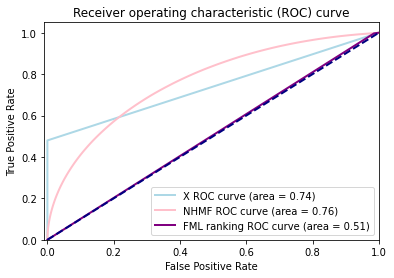

In [284]:
lw = 2
plt.plot(fpr_x, tpr_x, color='lightblue', lw=lw, label='X ROC curve (area = %0.2f)' % roc_auc_x)
#plt.plot(fpr_knn, tpr_knn, color='blue', lw=lw, label='KNN ROC curve (area = %0.2f)' % roc_auc_knn)
#plt.plot(fpr_ci, tpr_ci, color='red', lw=lw, label='CI ROC curve (area = %0.2f)' % roc_auc_ci)
plt.plot(fpr_nhmf, tpr_nhmf, color='pink', lw=lw, label='NHMF ROC curve (area = %0.2f)' % roc_auc_nhmf)
plt.plot(fpr_so, tpr_so, color='purple', lw=lw, label='FML ranking ROC curve (area = %0.2f)' % roc_auc_so)
#plt.plot(fpr_aa, tpr_aa, color='darkorange', lw=lw, label='scOpen filling ROC curve (area = %0.2f)' % roc_auc_aa)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

## FML Rating

In [44]:
coo_X = coo_matrix(X)
data = pd.DataFrame(np.array([coo_X.row + 1, coo_X.col + 1, coo_X.data], dtype=int).T, columns=["user_id", "item_id", "rating"])
data.to_csv("../FML/fuga.tsv", sep="\t", index=False, header=None)

In [46]:
!python ../FML/MetricFRating.py

2021-01-21 17:06:38.011401: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/package/ruby/2.5.1/lib:/usr/local/package/r/3.5.0/lib64/R/lib:/usr/local/package/python/3.6.5/lib:/usr/local/package/python/2.7.15/lib:/usr/local/package/protobuf/3.6.1/lib:/usr/local/package/postgresql/10.6/lib:/usr/local/package/mysql/5.7.24/lib:/usr/local/package/lua/5.3.5/lib:/usr/local/package/llvm/7.0.0/lib:/usr/local/package/gdb/9.2/lib:/usr/local/package/gcc/7.3.0/lib64:/usr/local/package/gcc/7.3.0/lib:/usr/local/lib64:/usr/local/lib
2021-01-21 17:06:38.011448: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
Instructions for updating:
non-resource variables are not supported in the long term
False
5000
1974
2021-01-21 17:06:57.065118: I tensor

In [48]:
FML = pd.read_csv("predicted_rate.tsv",sep="\t")
FML

,0,1,2,3,4,5,6,7,8,9,...,1964,1965,1966,1967,1968,1969,1970,1971,1972,1973
0,0.999994,0.999998,0.999998,1.000000,0.999976,1.0,0.999995,1.0,0.999987,0.999990,...,1.0,0.999988,1.0,0.999991,1.0,1.000000,1.0,0.999988,0.999993,1.0
1,1.000000,1.000000,1.000000,1.000000,0.999982,1.0,1.000000,1.0,0.999994,0.999997,...,1.0,0.999995,1.0,0.999997,1.0,1.000000,1.0,0.999995,1.000000,1.0
2,0.999997,1.000000,1.000000,1.000000,0.999979,1.0,0.999999,1.0,0.999991,0.999994,...,1.0,0.999992,1.0,0.999994,1.0,1.000000,1.0,0.999992,0.999997,1.0
3,0.999987,0.999992,0.999991,0.999994,0.999969,1.0,0.999989,1.0,0.999981,0.999984,...,1.0,0.999982,1.0,0.999984,1.0,1.000000,1.0,0.999982,0.999987,1.0
4,0.999979,0.999983,0.999983,0.999985,0.999960,1.0,0.999980,1.0,0.999972,0.999975,...,1.0,0.999973,1.0,0.999976,1.0,0.999991,1.0,0.999973,0.999978,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1.000000,1.000000,1.000000,1.000000,0.999982,1.0,1.000000,1.0,0.999994,0.999997,...,1.0,0.999995,1.0,0.999997,1.0,1.000000,1.0,0.999997,1.000000,1.0
4996,0.999993,0.999997,0.999997,0.999999,0.999975,1.0,0.999994,1.0,0.999986,0.999989,...,1.0,0.999987,1.0,0.999989,1.0,1.000000,1.0,0.999991,0.999992,1.0
4997,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.0,1.000000,1.000000,...,1.0,1.000000,1.0,1.000000,1.0,1.000000,1.0,1.000000,1.000000,1.0
4998,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.0,1.000000,1.000000,...,1.0,1.000000,1.0,1.000000,1.0,1.000000,1.0,1.000000,1.000000,1.0


In [50]:
FML.min().min()

0.9990474581718444